# Análise de Vendas de uma Padaria e Pastelaria

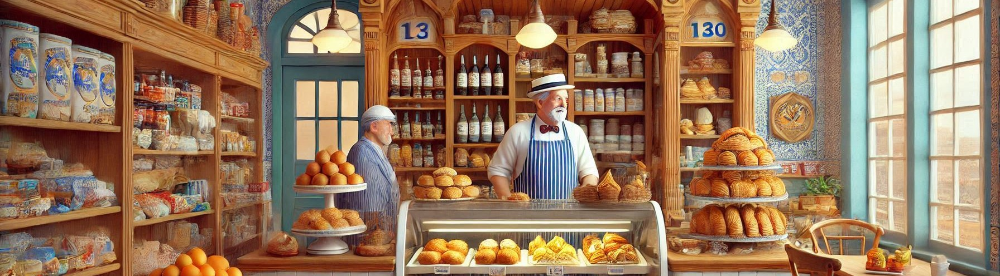

## Conteúdo
1. [Dataset](#Dataset)
2. [Importação e Preparação dos Dados](#Importação-e-Preparação-dos-Dados)
3. [Limpeza e Transformação dos Dados](#Limpeza-e-Transformação-dos-Dados)
4. [Análise Exploratória (EDA)](#Análise-Exploratória-(EDA))
   
   * [4.1. Distribuição Temporal](#4.1.-Distribuição-Temporal)
     
       + [a) Distribuição de Vendas ao Longo do Dia](#a\)-Distribuição-de-Vendas-ao-Longo-do-Dia)
         
       + [b) Distribuição de Vendas ao Longo da Semana](#b\)Distribuição-de-Vendas-ao-Longo-da-Semana)
         
       + [c) Distribuição de Vendas ao Longo do Mês](#c\)-Distribuição-de-Vendas-ao-Longo-do-Mês)
    
       + [d) Distribuição de Vendas ao Longo do Ano](#d\)-Distribuição-de-Vendas-ao-Longo-do-Ano)
         
    * [4.2. Produtos](#4.2.-Produtos)
      
       + [a) Vendas por Categoria](#a\)-Vendas-por-Categoria)
         
       + [b) Quantidades Vendidas](#b\)-Quantidades-Vendidas)
         
       + [c) Receitas](#c\)-Receitas)
    
       + [d) Produtos Comprados em Conjunto](#d\)-d\)-Produtos-Comprados-em-Conjunto)
         
       + [e) IVA de Produtos](#e\)-IVA-de-Produtos)
     
       + [f) Análise de preços](#f\)-Análise-de-preços)

5. [Previsões](#Previsões)

   * [5.1. Prophet](#5.1.-Prophet)
     
   * [5.2. Com base em literatura](#5.2.-Com-base-em-literatura)

6. [Insights e Conclusões](#6.-Insights-e-Conclusões)

   * [6.1. Insights](#6.1.-Insights)
     
   * [6.2. Conclusões](#6.2.-Conclusões)

## 1. Dataset
O dataset fornecido contém as vendas de uma padaria / mercearia desde 1 de janeiro até 8 de Dezembro de 2024.

Inclui três tabelas:
* Vendas -  que inclui toda a informação sobre as vendas (como data, produto, preço...)
* IVA - os regimes de IVA aplicados 
* produtos - lista de produtos que o estabelecimento vende 

A tabela central é a **tabela de vendas**, que inclui inclui os detalhes de cada venda, tais como:
- Data e hora da venda
- Código do produto
- Descrição do produto
- Quantidade vendida
- Preço unitário
- Valores de taxação, IVA, etc
 



### Bibliotecas

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pprint import pprint as pp
from itertools import combinations
from collections import Counter
import plotly.express as px
import numpy as np
from prophet import Prophet
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from matplotlib.dates import DayLocator, DateFormatter
from scipy.ndimage import gaussian_filter

## 2. Importação e Preparação dos Dados

In [8]:
df_vendas = pd.read_excel("SAF-T_2024_CAT.xlsx", sheet_name="Vendas")
df_iva = pd.read_excel("SAF-T_2024_CAT.xlsx", sheet_name="IVA")
df_produtos = pd.read_excel("SAF-T_2024_CAT.xlsx", sheet_name="Produtos")

**Nota:** Agradecimento à Nádia por ter categorizado os artigos em excel.

In [10]:
df_vendas

,ns1:InvoiceNo,ns1:ATCUD,ns1:InvoiceStatus,ns1:InvoiceStatusDate,ns1:InvoiceDate,ns1:InvoiceType,ns1:SystemEntryDate,ns1:MovementStartTime,ns1:LineNumber,ns1:ProductCode40,...,ns1:Description42,ns1:CreditAmount,ns1:TaxCode45,ns1:TaxPercentage46,ns1:TaxExemptionReason,ns1:TaxExemptionCode,ns1:TaxPayable,ns1:NetTotal,ns1:GrossTotal,ProductCategory
0,FS 87SEC224/1,JJ59TBKN-1,N,2024-01-02 11:21:02,2024-01-02,FS,2024-01-02 11:21:02,2024-01-02 11:21:00,1,1007,...,Pão Caseiro Pequeno,2.36,RED,6,NaN,NaN,0.14,2.36,2.50,Padaria
1,FS 87SEC224/2,JJ59TBKN-2,N,2024-01-02 11:26:48,2024-01-02,FS,2024-01-02 11:26:48,2024-01-02 11:26:00,1,1442,...,Cacete / Viana,2.25,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.00,2.25,2.25,Padaria
2,FS 87SEC224/3,JJ59TBKN-3,N,2024-01-02 11:32:26,2024-01-02,FS,2024-01-02 11:32:26,2024-01-02 11:32:00,1,1013,...,Bola Caseira,0.90,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.00,0.90,0.90,Padaria
3,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,1,1007,...,Pão Caseiro Pequeno,1.18,RED,6,NaN,NaN,0.15,1.80,1.95,Padaria
4,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,2,1056,...,Café,0.62,INT,13,NaN,NaN,0.15,1.80,1.95,Cafetaria
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85530,FS 87SEC224/44527,JJ59TBKN-44527,N,2024-12-08 18:11:33,2024-12-08,FS,2024-12-08 18:11:33,2024-12-08 18:11:00,1,1020,...,Fofa,0.41,RED,6,NaN,NaN,0.05,0.93,0.98,Padaria
85531,FS 87SEC224/44527,JJ59TBKN-44527,N,2024-12-08 18:11:33,2024-12-08,FS,2024-12-08 18:11:33,2024-12-08 18:11:00,2,1013,...,Bola Caseira,0.52,RED,6,NaN,NaN,0.05,0.93,0.98,Padaria
85532,FS 87SEC224/44528,JJ59TBKN-44528,N,2024-12-08 18:12:06,2024-12-08,FS,2024-12-08 18:12:06,2024-12-08 18:12:00,3,1020,...,Fofa,2.03,RED,6,NaN,NaN,0.12,2.03,2.15,Padaria
85533,FS 87SEC224/44529,JJ59TBKN-44529,N,2024-12-08 18:18:21,2024-12-08,FS,2024-12-08 18:18:21,2024-12-08 18:18:00,1,1007,...,Pão Caseiro Pequeno,5.09,RED,6,NaN,NaN,0.31,5.09,5.40,Padaria


In [11]:
df_vendas.shape

(85535, 25)

In [12]:
df_vendas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85535 entries, 0 to 85534
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ns1:InvoiceNo             85535 non-null  object        
 1   ns1:ATCUD                 85535 non-null  object        
 2   ns1:InvoiceStatus         85535 non-null  object        
 3   ns1:InvoiceStatusDate     85535 non-null  datetime64[ns]
 4   ns1:InvoiceDate           85535 non-null  datetime64[ns]
 5   ns1:InvoiceType           85535 non-null  object        
 6   ns1:SystemEntryDate       85535 non-null  datetime64[ns]
 7   ns1:MovementStartTime     85535 non-null  datetime64[ns]
 8   ns1:LineNumber            85535 non-null  int64         
 9   ns1:ProductCode40         85535 non-null  object        
 10  ns1:ProductDescription41  85535 non-null  object        
 11  ns1:Quantity              85535 non-null  float64       
 12  ns1:UnitOfMeasure 

In [13]:
df_vendas.describe()

,ns1:InvoiceStatusDate,ns1:InvoiceDate,ns1:SystemEntryDate,ns1:MovementStartTime,ns1:LineNumber,ns1:Quantity,ns1:UnitPrice,ns1:TaxPointDate,ns1:CreditAmount,ns1:TaxPercentage46,ns1:TaxPayable,ns1:NetTotal,ns1:GrossTotal
count,85535,85535,85535,85535,85535.000000,85535.000000,85535.000000,85535,85535.000000,85535.000000,85535.000000,85535.000000,85535.000000
mean,2024-06-27 00:57:22.101198336,2024-06-26 12:09:27.178348032,2024-06-27 00:57:16.642918400,2024-06-27 00:56:47.053019136,1.909008,1.496632,1.110056,2024-06-26 12:09:27.178348032,1.429175,11.592822,0.420100,3.758359,4.178459
min,2024-01-02 11:21:02,2024-01-02 00:00:00,2024-01-02 11:21:02,2024-01-02 11:21:00,1.000000,0.001000,0.000000,2024-01-02 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2024-04-07 10:38:51,2024-04-07 00:00:00,2024-04-07 10:38:51,2024-04-07 10:38:30,1.000000,1.000000,0.660000,2024-04-07 00:00:00,0.710000,6.000000,0.150000,1.655000,1.850000
50%,2024-07-01 16:59:57,2024-07-01 00:00:00,2024-07-01 16:59:57,2024-07-01 16:59:00,1.000000,1.000000,0.890000,2024-07-01 00:00:00,1.060000,13.000000,0.300000,2.780000,3.150000
75%,2024-09-16 07:07:24,2024-09-16 00:00:00,2024-09-16 07:07:24,2024-09-16 07:07:00,2.000000,2.000000,1.270000,2024-09-16 00:00:00,1.370000,13.000000,0.540000,5.000000,5.550000
max,2024-12-08 19:01:16,2024-12-08 00:00:00,2024-12-08 19:01:16,2024-12-08 19:01:00,19.000000,120.000000,80.000000,2024-12-08 00:00:00,80.000000,23.000000,16.440000,80.000000,87.930000
std,NaN,NaN,NaN,NaN,1.258640,1.425181,1.029657,NaN,1.359855,6.288259,0.441955,3.216956,3.569087


In [14]:
df_produtos

,ProductCode,ProductDescription,ProductCategory
0,1002,Coca-cola,Bebidas
1,1003,"Agua ,33 s/gas",Bebidas
2,1004,Agua c/gas Frize,Bebidas
3,1005,"Agua s/gas 0,5l",Bebidas
4,1007,Pão Caseiro Pequeno,Padaria
...,...,...,...
449,4000,Polpa de Tomate Amanhecer,Mercearia
450,4002,Trancetto Morango,Mercearia
451,4003,Madalenas Aurora,Mercearia
452,4501,guardanapos,Mercearia


In [15]:
df_iva

,IVA,PT,INT,Intermédia,13
0,IVA,PT,ISE,Isenta,0
1,IVA,PT,NOR,Normal,23
2,IVA,PT,RED,Reduzida,6


#### Transações Anuladas
Quando aparece *A* no *InvoiceStatus* significa que a transação foi anulada - podemos remover essas linhas.

In [17]:
df_vendas = df_vendas[df_vendas['ns1:InvoiceStatus'] != 'A']

#### Valores numéricos

In [19]:
# Verificação se as quantidades são int quando as quantidades são vendidas à unidade - dados que os restantes valores numéricos estão numa coluna float

# Para verificar que não são ints verificamos se todas as casa decimais são 0 
def casa_decimal_nao_zero(valor):
    try:
        decimais = str(valor).split('.')[1] 
        return all(d == '0' for d in decimais)
    except ValueError:
        return False

# selecção das vendas por unidade
df_vendas_unidades = df_vendas[df_vendas['ns1:UnitOfMeasure'] == 'Unidade']

# valores que verificam casas decimais todas 0
valores_int = df_vendas_unidades['ns1:Quantity'].apply(casa_decimal_nao_zero)
# valores que não verificam casas decimais todas 0
problemas = df_vendas_unidades[~valores_int] 

df_vendas = df_vendas.drop(problemas.index)

In [20]:
df_vendas

,ns1:InvoiceNo,ns1:ATCUD,ns1:InvoiceStatus,ns1:InvoiceStatusDate,ns1:InvoiceDate,ns1:InvoiceType,ns1:SystemEntryDate,ns1:MovementStartTime,ns1:LineNumber,ns1:ProductCode40,...,ns1:Description42,ns1:CreditAmount,ns1:TaxCode45,ns1:TaxPercentage46,ns1:TaxExemptionReason,ns1:TaxExemptionCode,ns1:TaxPayable,ns1:NetTotal,ns1:GrossTotal,ProductCategory
0,FS 87SEC224/1,JJ59TBKN-1,N,2024-01-02 11:21:02,2024-01-02,FS,2024-01-02 11:21:02,2024-01-02 11:21:00,1,1007,...,Pão Caseiro Pequeno,2.36,RED,6,NaN,NaN,0.14,2.36,2.50,Padaria
1,FS 87SEC224/2,JJ59TBKN-2,N,2024-01-02 11:26:48,2024-01-02,FS,2024-01-02 11:26:48,2024-01-02 11:26:00,1,1442,...,Cacete / Viana,2.25,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.00,2.25,2.25,Padaria
2,FS 87SEC224/3,JJ59TBKN-3,N,2024-01-02 11:32:26,2024-01-02,FS,2024-01-02 11:32:26,2024-01-02 11:32:00,1,1013,...,Bola Caseira,0.90,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.00,0.90,0.90,Padaria
3,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,1,1007,...,Pão Caseiro Pequeno,1.18,RED,6,NaN,NaN,0.15,1.80,1.95,Padaria
4,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,2,1056,...,Café,0.62,INT,13,NaN,NaN,0.15,1.80,1.95,Cafetaria
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85530,FS 87SEC224/44527,JJ59TBKN-44527,N,2024-12-08 18:11:33,2024-12-08,FS,2024-12-08 18:11:33,2024-12-08 18:11:00,1,1020,...,Fofa,0.41,RED,6,NaN,NaN,0.05,0.93,0.98,Padaria
85531,FS 87SEC224/44527,JJ59TBKN-44527,N,2024-12-08 18:11:33,2024-12-08,FS,2024-12-08 18:11:33,2024-12-08 18:11:00,2,1013,...,Bola Caseira,0.52,RED,6,NaN,NaN,0.05,0.93,0.98,Padaria
85532,FS 87SEC224/44528,JJ59TBKN-44528,N,2024-12-08 18:12:06,2024-12-08,FS,2024-12-08 18:12:06,2024-12-08 18:12:00,3,1020,...,Fofa,2.03,RED,6,NaN,NaN,0.12,2.03,2.15,Padaria
85533,FS 87SEC224/44529,JJ59TBKN-44529,N,2024-12-08 18:18:21,2024-12-08,FS,2024-12-08 18:18:21,2024-12-08 18:18:00,1,1007,...,Pão Caseiro Pequeno,5.09,RED,6,NaN,NaN,0.31,5.09,5.40,Padaria


#### Valores Ausentes 

In [22]:
df_vendas.isnull().sum()

ns1:InvoiceNo                   0
ns1:ATCUD                       0
ns1:InvoiceStatus               0
ns1:InvoiceStatusDate           0
ns1:InvoiceDate                 0
ns1:InvoiceType                 0
ns1:SystemEntryDate             0
ns1:MovementStartTime           0
ns1:LineNumber                  0
ns1:ProductCode40               0
ns1:ProductDescription41        0
ns1:Quantity                    0
ns1:UnitOfMeasure               0
ns1:UnitPrice                   0
ns1:TaxPointDate                0
ns1:Description42               0
ns1:CreditAmount                0
ns1:TaxCode45                   0
ns1:TaxPercentage46             0
ns1:TaxExemptionReason      82129
ns1:TaxExemptionCode        82129
ns1:TaxPayable                  0
ns1:NetTotal                    0
ns1:GrossTotal                  0
ProductCategory                 0
dtype: int64

Podemos verificar que apenas as colunas relativas a *TaxExemption* - Isenção de Imposto - têm valores ausentes, o que faz sentido dado que não se aplica a todos os artigos/transações.

#### Correção de Valores Discordantes

In [25]:
#Verificar se os cálculos estão correctos
df_vendas['ns1:NetTotal'] = df_vendas['ns1:Quantity'] * df_vendas['ns1:UnitPrice']
df_vendas['ns1:TaxPayable'] = (df_vendas['ns1:NetTotal'] * (df_vendas['ns1:TaxPercentage46'] / 100)).round(3)
df_vendas['ns1:GrossTotal'] = (df_vendas['ns1:NetTotal'] + df_vendas['ns1:TaxPayable']).round(2)

#### Índices não inteiros

In [27]:
df_produtos.at[270, 'ProductCode']

'17,16'

In [28]:
df_produtos.at[270, 'ProductCode'] = 1716

## 3. Limpeza e Transformação dos Dados

#### Padronização do nome das colunas

In [31]:
df_vendas.columns = df_vendas.columns.str.replace('ns1:', '')

In [32]:
df_vendas.head(5)

,InvoiceNo,ATCUD,InvoiceStatus,InvoiceStatusDate,InvoiceDate,InvoiceType,SystemEntryDate,MovementStartTime,LineNumber,ProductCode40,...,Description42,CreditAmount,TaxCode45,TaxPercentage46,TaxExemptionReason,TaxExemptionCode,TaxPayable,NetTotal,GrossTotal,ProductCategory
0,FS 87SEC224/1,JJ59TBKN-1,N,2024-01-02 11:21:02,2024-01-02,FS,2024-01-02 11:21:02,2024-01-02 11:21:00,1,1007,...,Pão Caseiro Pequeno,2.36,RED,6,NaN,NaN,0.142,2.36,2.50,Padaria
1,FS 87SEC224/2,JJ59TBKN-2,N,2024-01-02 11:26:48,2024-01-02,FS,2024-01-02 11:26:48,2024-01-02 11:26:00,1,1442,...,Cacete / Viana,2.25,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.000,2.25,2.25,Padaria
2,FS 87SEC224/3,JJ59TBKN-3,N,2024-01-02 11:32:26,2024-01-02,FS,2024-01-02 11:32:26,2024-01-02 11:32:00,1,1013,...,Bola Caseira,0.90,ISE,0,Isenção de IVA com direito à dedução no cabaz ...,M26,0.000,0.90,0.90,Padaria
3,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,1,1007,...,Pão Caseiro Pequeno,1.18,RED,6,NaN,NaN,0.071,1.18,1.25,Padaria
4,FS 87SEC224/4,JJ59TBKN-4,N,2024-01-02 11:34:26,2024-01-02,FS,2024-01-02 11:34:26,2024-01-02 11:34:00,2,1056,...,Café,0.62,INT,13,NaN,NaN,0.081,0.62,0.70,Cafetaria


#### Criar colunas derivadas

##### Extrair Info Datas

In [35]:
# Extrair nomes do mês e do dia da semana, respetivamente
df_vendas["month"] = df_vendas["InvoiceStatusDate"].dt.month
df_vendas["DiaSemana"] = df_vendas["InvoiceStatusDate"].dt.weekday
df_vendas["hour"] = df_vendas["SystemEntryDate"].dt.hour
df_vendas["day"] = df_vendas["SystemEntryDate"].dt.day
df_vendas["dayofweek"] = df_vendas["SystemEntryDate"].dt.dayofweek
df_vendas["date"] = df_vendas["SystemEntryDate"].dt.date

**Nota:**
Há alguns problemas nas descrições dos produtos na tabela de vendas. Caso tivessemos mais tempo, seria ideal limpar/uniformizar a tabela de produtos e posterior merge com a tabela de vendas (através do *ProductCode*) para mais fácil análise futura.


## 4. Análise Exploratória (EDA)

### 4.1. Distribuição Temporal 

Vamos tentar investigar como variaram as vendas ao longo do ano 2024 (de 2/1 a 8/12).

### Heatmap de vendas por dia da semana e hora

C:\Users\sergio\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


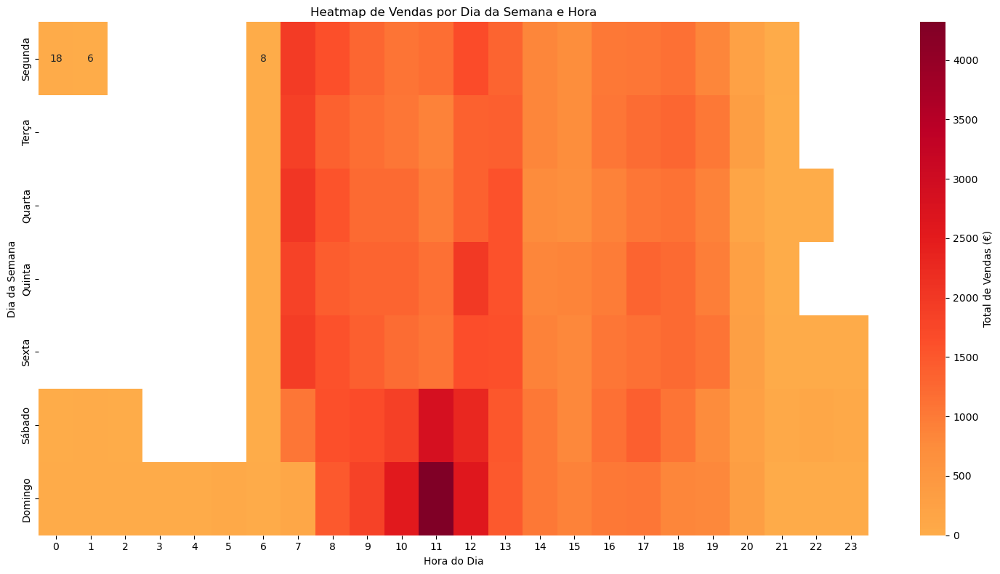

In [41]:
# Heatmap de Vendas por Dia da Semana e Hora
dias_semana = {
    0: 'Segunda',
    1: 'Terça',
    2: 'Quarta',
    3: 'Quinta',
    4: 'Sexta',
    5: 'Sábado',
    6: 'Domingo'
}

pivot_table = df_vendas.pivot_table(
    values='NetTotal',
    index='DiaSemana',
    columns='hour',
    aggfunc='sum'
)

pivot_table.index = pivot_table.index.map(dias_semana)

plt.figure(figsize=(15, 8))
sns.heatmap(pivot_table, 
            cmap='YlOrRd',
            annot=True,
            fmt='.0f',
            cbar_kws={'label': 'Total de Vendas (€)'},
            center=pivot_table.mean().mean())

plt.title('Heatmap de Vendas por Dia da Semana e Hora')
plt.xlabel('Hora do Dia')
plt.ylabel('Dia da Semana')
plt.tight_layout()
plt.show()

* Combinação com mais receita: 11h de Domingo

### a) Distribuição de Vendas ao Longo do Dia

#### Será que as horas são bem distribuídas?

In [45]:
n_dias = df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').count()
n_dias

hour
0       3
1       3
2       2
3       1
4       1
5       1
6       9
7     300
8     341
9     340
10    340
11    342
12    341
13    342
14    342
15    337
16    337
17    337
18    339
19    327
20    230
21     18
22      5
23      3
Name: NetTotal, dtype: int64

* A maior parte dos dias só temos registos entre as 7h e as 20h

#### A que dias se referem as horas com menos valores?

In [48]:
dias_fora_de_horas = df_vendas[df_vendas['hour'].isin([23, 0, 1, 2, 3, 4, 5])]['date'].unique()
dias_22 = df_vendas[df_vendas['hour'] == 22]['date'].unique()
dias_21_6 = df_vendas[df_vendas['hour'].isin([21,6])]['date'].unique()

print('Dias com vendas entre as 23h e 5h:')
pp([data.strftime('%d-%m-%Y') for data in list(dias_fora_de_horas)])

print('\nDias com vendas às 22h:')
pp([data.strftime('%d-%m-%Y') for data in list(dias_22)])

print('\nDias com vendas às 6h e 21h (período prolongado):')
pp([data.strftime('%d-%m-%Y') for data in list(dias_21_6)])


Dias com vendas entre as 23h e 5h:
['06-09-2024', '07-09-2024', '08-09-2024', '09-09-2024']

Dias com vendas às 22h:
['04-08-2024', '06-09-2024', '07-09-2024', '08-09-2024', '09-10-2024']

Dias com vendas às 6h e 21h (período prolongado):
['02-03-2024',
 '15-04-2024',
 '08-05-2024',
 '20-05-2024',
 '03-06-2024',
 '08-06-2024',
 '15-06-2024',
 '20-06-2024',
 '22-06-2024',
 '27-06-2024',
 '28-06-2024',
 '02-07-2024',
 '07-07-2024',
 '06-08-2024',
 '23-08-2024',
 '06-09-2024',
 '07-09-2024',
 '08-09-2024',
 '16-09-2024',
 '18-09-2024',
 '20-09-2024',
 '07-10-2024',
 '18-10-2024',
 '22-10-2024',
 '27-11-2024',
 '05-12-2024']


* Reparamos que existem vendas entre as 21h e 6h relativas apenas aos dias 6 a 9 de Setembro, provavelmente associado a alguma festividade local.
* Também no dia 4 de Agosto existem vendas às 22h. Existem alguns dias com vendas às 6h e 21h (26 dias) - **período prolongado** - sem padrão aparente.
* Deste modo consideramos pouco razoável olhar para esses períodos em simultâneo com o período de **funcionamento regular** (das **7h** às **20h**).  

#### Em que horas há mais movimento?

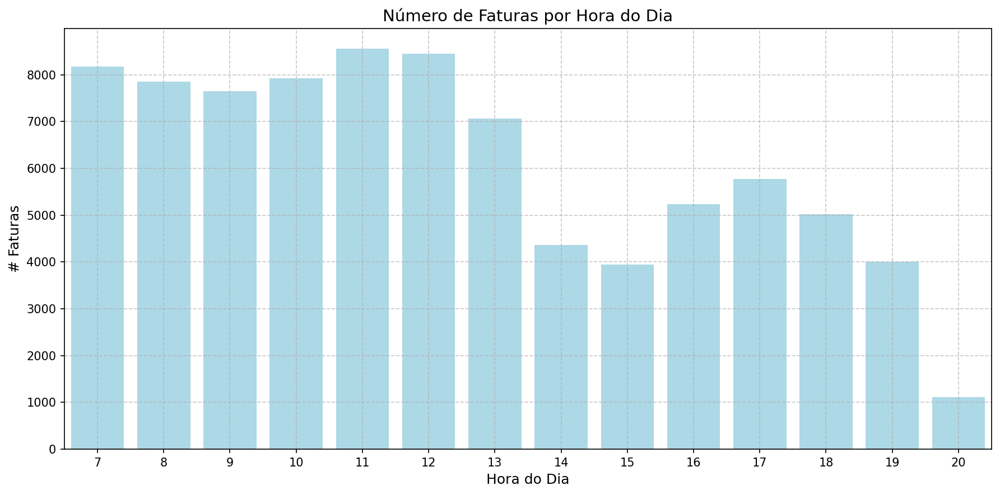

In [51]:
n_invoices = df_vendas.groupby(['hour'])['InvoiceNo'].count()
n_invoices

plt.figure(figsize = (12, 6), dpi = 150)
plt.bar(n_invoices.index,n_invoices, color='lightblue')

plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('# Faturas', fontsize=12)

plt.xticks(n_invoices.index)
plt.xlim(6.5,20.5)
plt.grid(linestyle="--", alpha=0.7)

plt.title('Número de Faturas por Hora do Dia', fontsize=14)
plt.tight_layout()
plt.show()

* Horas com mais movimento:  11h / 12h

#### Vendas Totais

In [54]:
receitas_por_hora = df_vendas.groupby('hour')['NetTotal'].sum()
qtd_por_hora = df_vendas.groupby('hour')['Quantity'].sum()

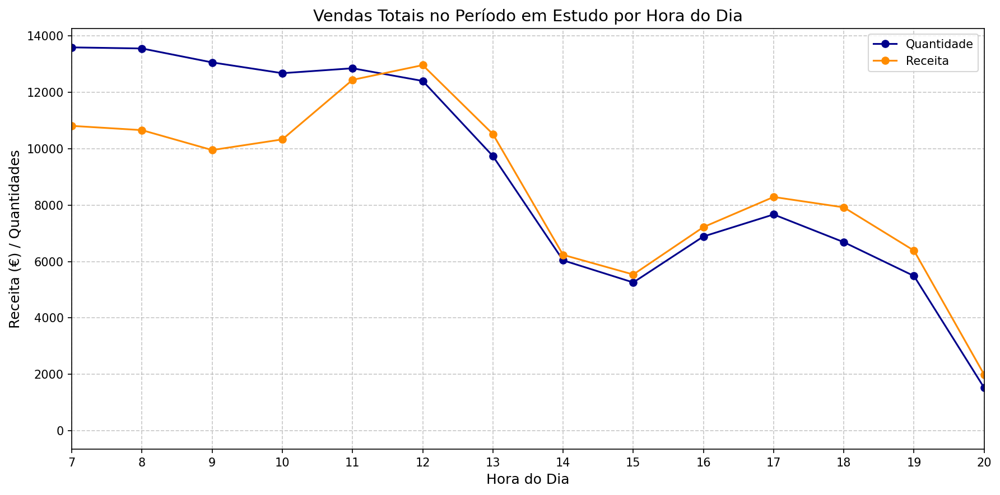

In [55]:
receitas_por_hora = df_vendas.groupby('hour')['NetTotal'].sum()
qtd_por_hora = df_vendas.groupby('hour')['Quantity'].sum()

plt.figure(figsize = (12, 6), dpi = 150)

# Plot das quantidades totais por hora
plt.plot(qtd_por_hora.index, qtd_por_hora, label = "Quantidade", marker='o', color = 'darkblue', linestyle='-')

# Plot das receitas totais por hora
plt.plot(receitas_por_hora.index, receitas_por_hora, label = "Receita", marker='o', color = 'darkorange', linestyle='-')

plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('Receita (€) / Quantidades', fontsize=12)

plt.xticks(receitas_por_hora.index)
plt.xlim(7,20)
plt.grid(linestyle="--", alpha=0.7)

plt.legend()

plt.title('Vendas Totais no Período em Estudo por Hora do Dia', fontsize=14)
plt.tight_layout()
plt.show()

* Podemos observar um pico nas vendas às 7h da manhã. A receita está abaixo das quantidades vendidas dessa hora e até às 11h.  
* Entre as 11h e as 12h a receita supera as quantidades vendidas (e mantém-se superior o resto do dia) e atinge às 12h o máximo diário.    
* A partir dessa hora, a quantidade e receita diminuem até às 15h da tarde, voltam a aumentar entre as 15h e as 17h, onde atingem o segundo pico do dia, antes de voltar a diminuir. 

##### Porque é maior a quantidade vs receita só da parte da manhã?

##### Manhã 

         ProductDescription41  UnitPrice  AvgQuantity
127                      FOFA       0.41         2.97
69                       CAFÉ       0.66         1.28
39                      BEBÉS       0.26         3.31
57   BOLOS P/ CONSUMO INTERNO       1.11         1.12
232       PÃO CASEIRO PEQUENO       1.26         1.20
67             CACETE / VIANA       0.45         2.04
203               MENÚ NORMAL       1.34         1.19
236              PÃO INTEGRAL       0.47         2.44
1                   ABATANADO       0.80         1.08
222            PASTEL DE NATA       0.98         2.22


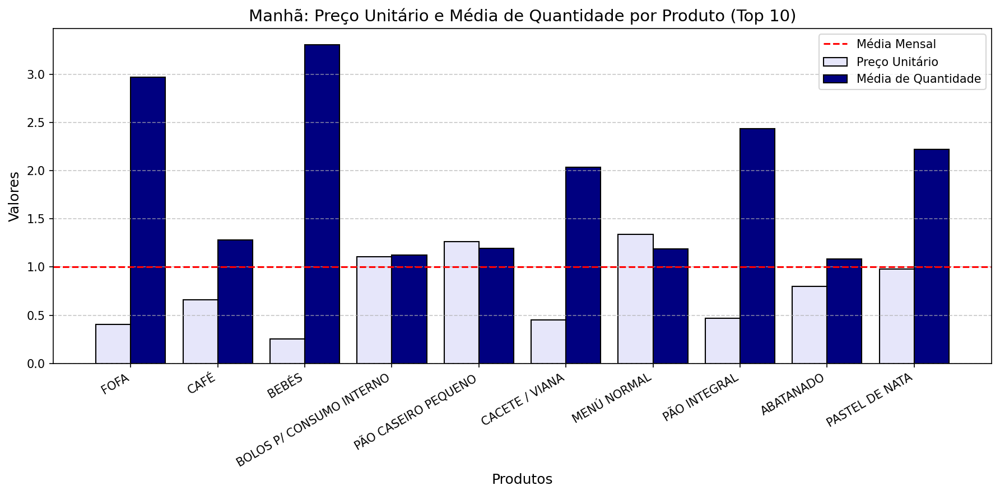

In [59]:
# Agrupar os produtos para calcular a soma, média e o preço unitário
mais_vendidos = df_vendas[df_vendas['hour'].isin([7,8,9,10,11])].groupby('ProductDescription41').agg(
    TotalQuantity=('Quantity', 'sum'),   # Quantidade total vendida
    AvgQuantity=('Quantity', 'mean'),   # Média de quantidades pedidas
    UnitPrice=('UnitPrice', 'mean')     # Preço unitário médio
).reset_index()

# Ordenar pelos produtos mais vendidos (maior quantidade total)
mais_vendidos = mais_vendidos.sort_values(by='TotalQuantity', ascending=False)

# Selecionar os 10 produtos mais vendidos
top10_produtos = mais_vendidos.head(10)

# Exibir o resultado com nome, preço unitário e média de quantidade pedida
print(top10_produtos[['ProductDescription41', 'UnitPrice', 'AvgQuantity']].round(2))

# Dados do top 10 produtos
top10_produtos = top10_produtos[['ProductDescription41', 'UnitPrice', 'AvgQuantity']]

# Definir posições para as barras
x = np.arange(len(top10_produtos['ProductDescription41']))  # Índices para o eixo X

# Tamanho do gráfico
plt.figure(figsize=(12, 6), dpi = 150)

# Barras para o preço unitário
plt.bar(x - 0.2, top10_produtos['UnitPrice'], width=0.4, label='Preço Unitário', color='lavender',edgecolor='black')
plt.axhline(y=1, color='red', linestyle='--', label='Média Mensal')

# Barras para a média de quantidades pedidas
plt.bar(x + 0.2, top10_produtos['AvgQuantity'], width=0.4, label='Média de Quantidade', color='navy',edgecolor='black')

# Adicionar rótulos e título
plt.xlabel('Produtos', fontsize=12)
plt.ylabel('Valores', fontsize=12)
plt.title('Manhã: Preço Unitário e Média de Quantidade por Produto (Top 10)', fontsize=14)
plt.xticks(x, top10_produtos['ProductDescription41'], rotation=30, ha='right')  # Rotação para os nomes dos produtos
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

##### Tarde

         ProductDescription41  UnitPrice  AvgQuantity
83                       CAFÉ       0.66         1.31
286       PÃO CASEIRO PEQUENO       1.27         1.17
55               BOLA CASEIRA       0.52         1.86
50                      BEBÉS       0.21         3.08
153                      FOFA       0.40         2.34
70   BOLOS P/ CONSUMO INTERNO       1.15         1.10
90               CERVEJA MINI       0.87         1.54
91              CERVEJA MÉDIA       1.08         1.65
79       BROAS DE BATATA DOCE       1.12         1.78
319              SOPA VARIADA       1.67         1.50


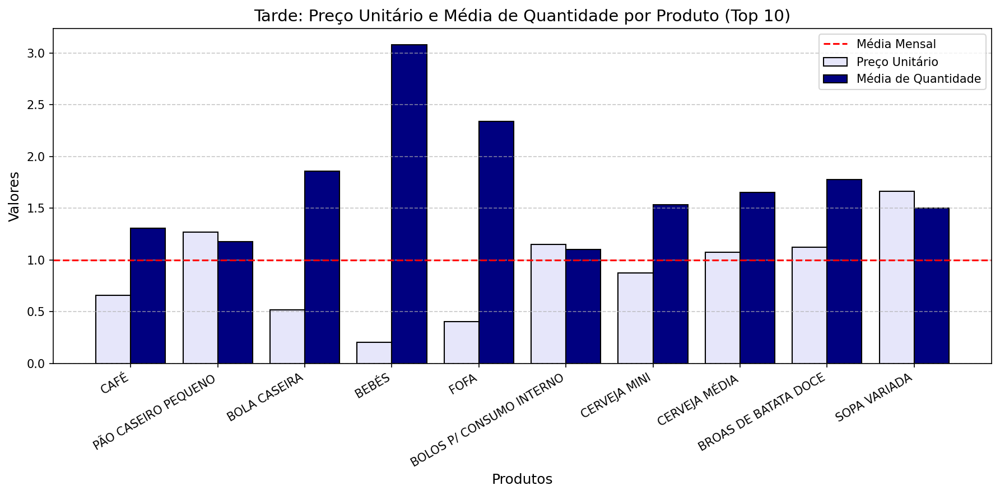

In [61]:
# Agrupar os produtos para calcular a soma, média e o preço unitário
mais_vendidos = df_vendas[df_vendas['hour'].isin([n for n in range(12,21)])].groupby('ProductDescription41').agg(
    TotalQuantity=('Quantity', 'sum'),   # Quantidade total vendida
    AvgQuantity=('Quantity', 'mean'),   # Média de quantidades pedidas
    UnitPrice=('UnitPrice', 'mean')     # Preço unitário médio
).reset_index()

# Ordenar pelos produtos mais vendidos (maior quantidade total)
mais_vendidos = mais_vendidos.sort_values(by='TotalQuantity', ascending=False)

# Selecionar os 10 produtos mais vendidos
top10_produtos = mais_vendidos.head(10)

# Exibir o resultado com nome, preço unitário e média de quantidade pedida
print(top10_produtos[['ProductDescription41', 'UnitPrice', 'AvgQuantity']].round(2))

# Dados do top 10 produtos
top10_produtos = top10_produtos[['ProductDescription41', 'UnitPrice', 'AvgQuantity']]

# Definir posições para as barras
x = np.arange(len(top10_produtos['ProductDescription41']))  # Índices para o eixo X

# Tamanho do gráfico
plt.figure(figsize=(12, 6), dpi = 150)

# Barras para o preço unitário
plt.bar(x - 0.2, top10_produtos['UnitPrice'], width=0.4, label='Preço Unitário', color='lavender',edgecolor='black')
plt.axhline(y=1, color='red', linestyle='--', label='Média Mensal')

# Barras para a média de quantidades pedidas
plt.bar(x + 0.2, top10_produtos['AvgQuantity'], width=0.4, label='Média de Quantidade', color='navy',edgecolor='black')

# Adicionar rótulos e título
plt.xlabel('Produtos', fontsize=12)
plt.ylabel('Valores', fontsize=12)
plt.title('Tarde: Preço Unitário e Média de Quantidade por Produto (Top 10)', fontsize=14)
plt.xticks(x, top10_produtos['ProductDescription41'], rotation=30, ha='right')  # Rotação para os nomes dos produtos
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

* Conseguimos observar que de manhã as quantidades / relevância de bebés e fofas é maior apesar do seu preço unitário ser menor
* O padrão altera-se por volta das 12h, em que a bola / pão caseiro ganham popularidade, com preços unitários maiores

#### Valores Médios

In [64]:
receitas_med_por_hora = df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').mean()
min_receitas_por_hora = df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').min()
max_receitas_por_hora = df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').max()

#df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').describe()[['mean','min','max', 'std']]

In [65]:
qtd_med_por_hora = df_vendas.groupby(['hour', 'date'])['Quantity'].sum().groupby('hour').mean()
min_qtd_por_hora = df_vendas.groupby(['hour', 'date'])['Quantity'].sum().groupby('hour').min()
max_qtd_por_hora = df_vendas.groupby(['hour', 'date'])['Quantity'].sum().groupby('hour').max()

#df_vendas.groupby(['hour', 'date'])['Quantity'].sum().groupby('hour').describe()[['mean','min','max', 'std']]

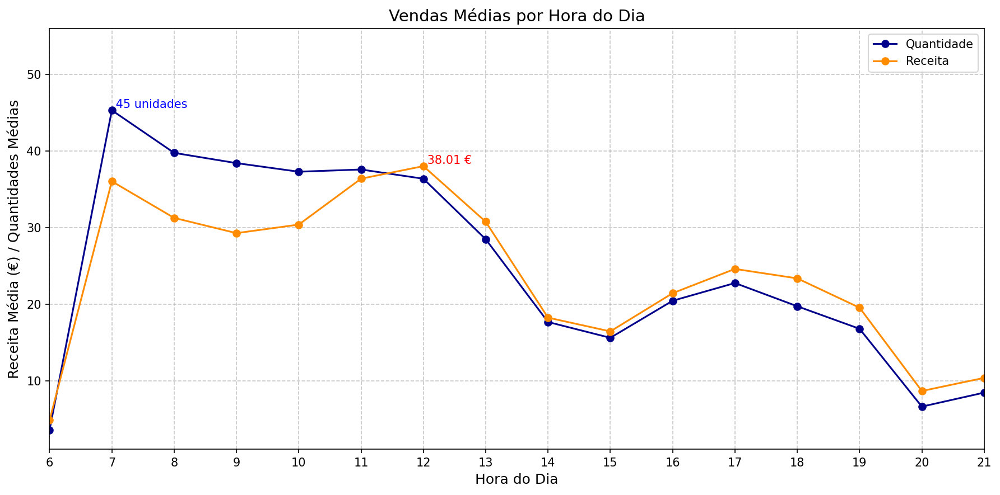

In [66]:
plt.figure(figsize = (12, 6), dpi = 150)

# Plot das quantidades médias por hora
plt.plot(qtd_med_por_hora.index, qtd_med_por_hora, label = "Quantidade", marker='o', color = 'darkblue', linestyle='-')

# Plot das receitas médias por hora
plt.plot(receitas_med_por_hora.index, receitas_med_por_hora, label = "Receita", marker='o', color = 'darkorange', linestyle='-')

plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('Receita Média (€) / Quantidades Médias', fontsize=12)

plt.xticks(receitas_med_por_hora.index)
plt.xlim(6,21)
plt.grid(linestyle="--", alpha=0.7)

# valor máximo e a hora em que ele ocorre
max_qtd = qtd_med_por_hora.max()
max_hora_qtd = qtd_med_por_hora.idxmax()

# valor máximo e o dia da semana em que ele ocorre
max_receita = receitas_med_por_hora[6:-3].max()
max_hora_receita = receitas_med_por_hora[6:-3].idxmax()

# mostrar o valor máximo na sua coordenada
plt.text(max_hora_receita, max_receita, f'{max_receita: .2f} €', ha='left', va = 'bottom', color = 'red')
plt.text(max_hora_qtd, max_qtd, f'{max_qtd: .0f} unidades', ha='left', va = 'bottom', color = 'blue')

plt.legend()

plt.title('Vendas Médias por Hora do Dia', fontsize=14)
plt.tight_layout()
plt.show()

* Podemos ver que às 12h a receita atinge um máximo de $\approx$38€ por hora, não muito distante do valor das 7h de $\approx$36€.
* À tarde a receita desce até aos $\approx$16.5€ por hora antes de voltar a subir até para os $\approx$24.5€ às 17h, voltando a descer.
* Podemos também observar que as médias de receita / quantidades vendidas para o período prolongado não são significativas...
* Estes valores estão de acordo com o observado para os valores totais.

#### Mas quanto variam os valores em relação à média?

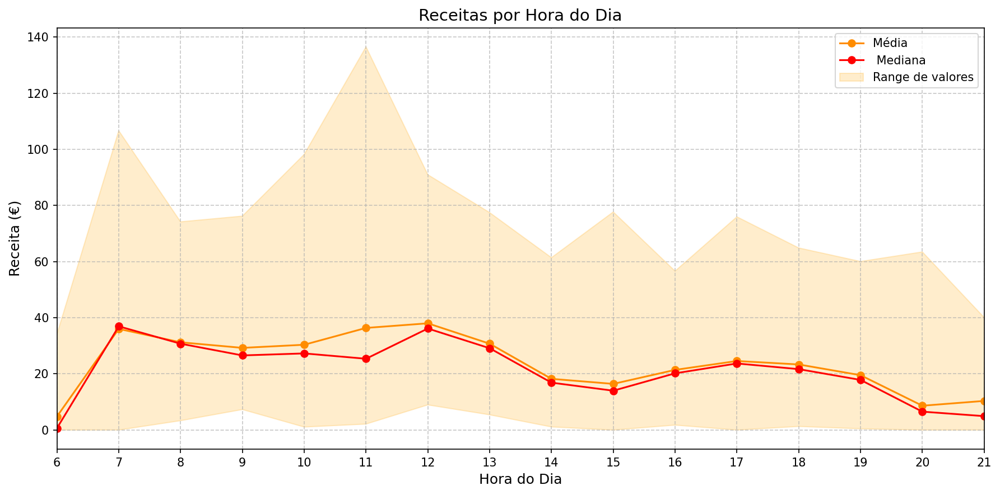

In [69]:
plt.figure(figsize = (12, 6), dpi = 150)

mediana = df_vendas.groupby(['hour', 'date'])['NetTotal'].sum().groupby('hour').median()

# Plot das receitas médias por hora
plt.plot(receitas_med_por_hora.index, receitas_med_por_hora, label = "Média", marker='o', color = 'darkorange', linestyle='-')

# Plot da mediana das receitas por hora
plt.plot(receitas_med_por_hora.index, mediana, label = " Mediana", marker='o', color = 'red', linestyle='-')

# range de valores entre max e min
plt.fill_between(receitas_med_por_hora.index, min_receitas_por_hora, max_receitas_por_hora, color = 'orange', alpha = 0.2, label = 'Range de valores')

plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('Receita (€)', fontsize=12)

plt.xticks(receitas_med_por_hora.index)
plt.xlim(6,21)
plt.grid(linestyle="--", alpha=0.7)

plt.legend()

plt.title('Receitas por Hora do Dia', fontsize=14)
plt.tight_layout()
plt.show()

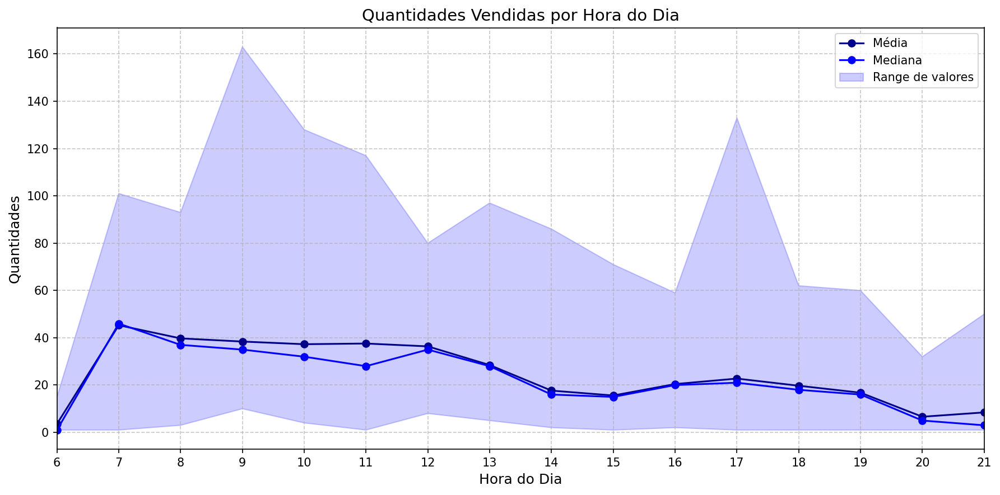

In [70]:
plt.figure(figsize = (12, 6), dpi = 150)

mediana = df_vendas.groupby(['hour', 'date'])['Quantity'].sum().groupby('hour').median()

# Plot das quantidades médias por hora
plt.plot(qtd_med_por_hora.index, qtd_med_por_hora, label = "Média", marker='o', color = 'darkblue', linestyle='-')
# Plot da mediana das quantidades por hora
plt.plot(qtd_med_por_hora.index, mediana, label = "Mediana", marker='o', color = 'blue', linestyle='-')

plt.fill_between(qtd_med_por_hora.index, min_qtd_por_hora, max_qtd_por_hora, color = 'blue', alpha = 0.2, label = 'Range de valores') 

plt.xlabel('Hora do Dia', fontsize=12)
plt.ylabel('Quantidades', fontsize=12)

plt.xticks(receitas_med_por_hora.index)
plt.xlim(6,21)
plt.grid(linestyle="--", alpha=0.7)

plt.legend()

plt.title('Quantidades Vendidas por Hora do Dia', fontsize=14)
plt.tight_layout()
plt.show()

* Podemos ver que há variações relativas nos mínimos e máximos de receitas e quantidades vendidas, particularmente nos máximos.
* Os máximos variam muito mais que os mínimos, provavelmente porque os máximos são muito mais influênciados por eventos extraordinários que os mínimos (clientela base) -> como podemos ver com as medianas

###  b) Distribuição de Vendas ao Longo da Semana

In [73]:
df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').count()

dayofweek
0    48
1    49
2    49
3    49
4    49
5    49
6    49
Name: NetTotal, dtype: int64

O número de dias da semana estão equilibrados (apesar de dezembro não estar completo).

#### Valores Totais

In [76]:
receitas_dia_semana = df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').sum()
qtd_dia_semana = df_vendas.groupby(['dayofweek', 'date'])['Quantity'].sum().groupby('dayofweek').sum()

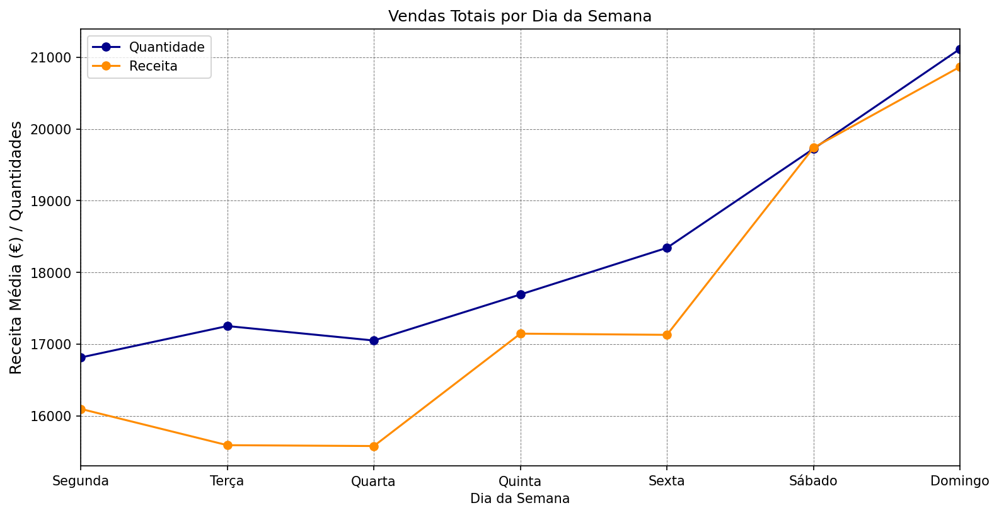

In [77]:
plt.figure(figsize=(12, 6), dpi = 150)

# Plot das quantidades totais por dia da semana
plt.plot(qtd_dia_semana.index, qtd_dia_semana.values,  marker='o', color = 'darkblue', linestyle='-', label = "Quantidade")

# Plot das receitas totais por dia da semana
plt.plot(receitas_dia_semana.index, receitas_dia_semana.values, label = "Receita", marker='o', color = 'darkorange', linestyle='-')

plt.xlabel('Dia da Semana')
plt.ylabel(f'Receita Média (€) / Quantidades', fontsize=12)
plt.title('Vendas Totais por Dia da Semana')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.xlim(0,6)
dias_da_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks([n for n in range(0,7)], dias_da_semana)

plt.show()

* As quantidades vendidas apresentaram crescimento estável de quinta a domingo e valores mínimos no ínicio da semana.
* As receitas apresentaram um mínimo na terça / quarta e um máximo no domingo.

#### Valores Médios

In [80]:
receitas_med_dia_semana = df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').mean()
qtd_med_dia_semana = df_vendas.groupby(['dayofweek', 'date'])['Quantity'].sum().groupby('dayofweek').mean()

print(receitas_med_dia_semana)

dayofweek
0    335.382792
1    318.220184
2    317.980041
3    349.944347
4    349.599816
5    402.804571
6    425.828694
Name: NetTotal, dtype: float64


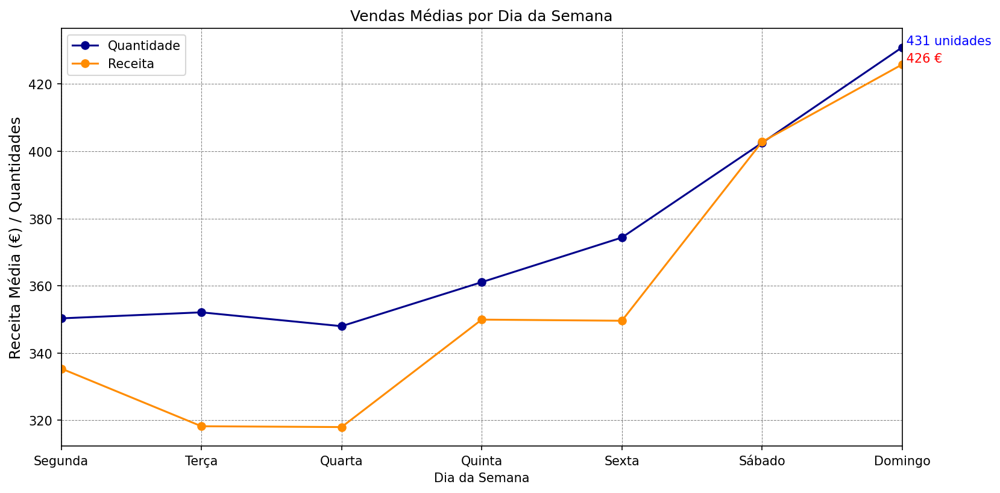

In [81]:
plt.figure(figsize=(12, 6), dpi = 150)

# Plot das quantidades médias por dia da semana
plt.plot(qtd_med_dia_semana.index, qtd_med_dia_semana.values,  marker='o', color = 'darkblue', linestyle='-', label = "Quantidade")

# Plot das receitas médias por dia da semana
plt.plot(receitas_med_dia_semana.index, receitas_med_dia_semana.values, label = "Receita", marker='o', color = 'darkorange', linestyle='-')

plt.xlabel('Dia da Semana')
plt.ylabel(f'Receita Média (€) / Quantidades', fontsize=12)
plt.title('Vendas Médias por Dia da Semana')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.xlim(0,6)
dias_da_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks([n for n in range(0,7)], dias_da_semana)

# valor máximo e o dia da semana em que ele ocorre
max_qtd = qtd_med_dia_semana.max()
max_dia_semana_qtd = qtd_med_dia_semana.idxmax()

# valor máximo e o dia da semana em que ele ocorre
max_receita = receitas_med_dia_semana.max()
max_dia_semana_receita = receitas_med_dia_semana.idxmax()

# mostrar o valor máximo na sua coordenada
plt.text(max_dia_semana_receita, max_receita, f'{max_receita: .0f} €', ha='left', va = 'bottom', color = 'red')
plt.text(max_dia_semana_qtd, max_qtd, f'{max_qtd: .0f} unidades', ha='left', va = 'bottom', color = 'blue')
plt.show()

* As receitas médias diárias variam entre $\approx$318€ e $\approx$428€ desde terça (mínimo) a domingo (máximo). 
* As quantidades variam menos em média, mantendo valores semelhantes no ínicio da semana e começando a aumentar sexta até chegar ao máximo no domingo.

#### Quanto variam os valores em relação à média?

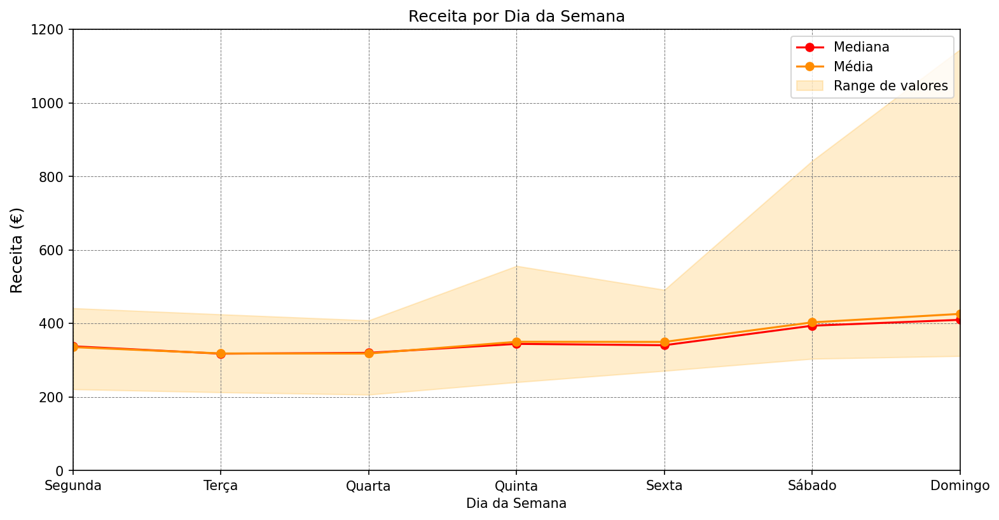

In [84]:
min_dds = df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').min()
max_dds = df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').max()
mediana = df_vendas.groupby(['dayofweek', 'date'])['NetTotal'].sum().groupby('dayofweek').median()

plt.figure(figsize=(12, 6), dpi = 150)

# Plot das medianas por dia da semana
plt.plot(mediana.index, mediana.values,  marker='o', color = 'red', linestyle='-', label = "Mediana")

# Plot das receitas médias por dia da semana
plt.plot(receitas_med_dia_semana.index, receitas_med_dia_semana.values, label = "Média", marker='o', color = 'darkorange', linestyle='-')

plt.fill_between(receitas_med_dia_semana.index, min_dds, max_dds, color = 'orange', alpha = 0.2, label = 'Range de valores')
 
plt.xlabel('Dia da Semana')
plt.ylabel(f'Receita (€)', fontsize=12)
plt.title('Receita por Dia da Semana')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.ylim(0,1200)
plt.yticks()

plt.xlim(0,6)
dias_da_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks([n for n in range(0,7)], dias_da_semana)

plt.show()

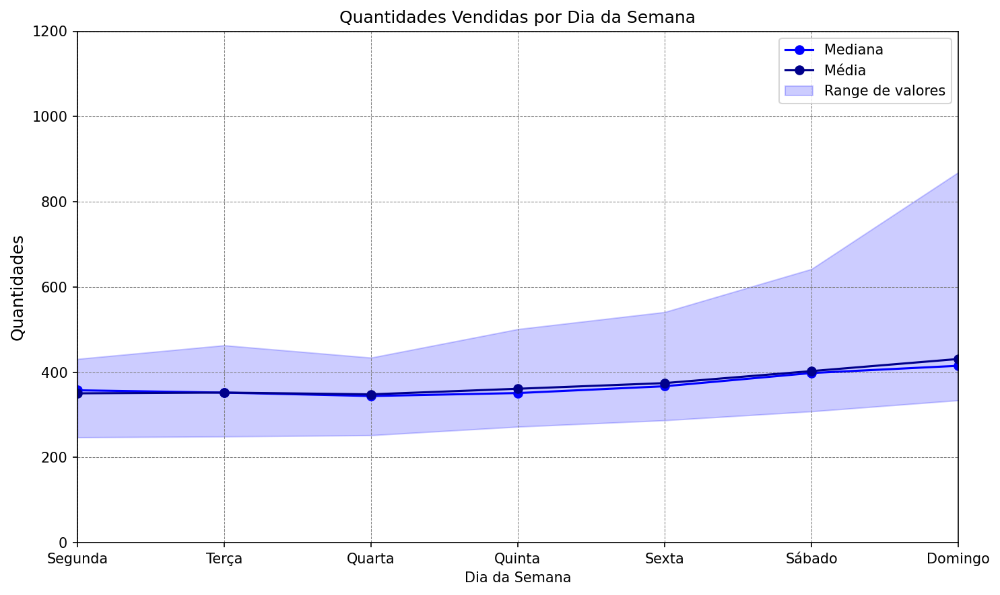

In [85]:
min_dds = df_vendas.groupby(['dayofweek', 'date'])['Quantity'].sum().groupby('dayofweek').min()
max_dds = df_vendas.groupby(['dayofweek', 'date'])['Quantity'].sum().groupby('dayofweek').max()
mediana = df_vendas.groupby(['dayofweek', 'date'])['Quantity'].sum().groupby('dayofweek').median()

plt.figure(figsize=(10, 6), dpi = 150)

# Plot da mediana das quantidades por dia da semana
plt.plot(mediana.index, mediana.values,  marker='o', color = 'blue', linestyle='-', label = "Mediana")

# Plot das quantidades médias por dia da semana
plt.plot(qtd_med_dia_semana.index, qtd_med_dia_semana.values, label = "Média", marker='o', color = 'darkblue', linestyle='-')

plt.fill_between(qtd_med_dia_semana.index, min_dds, max_dds, color = 'blue', alpha = 0.2, label = 'Range de valores')

plt.xlabel('Dia da Semana')
plt.ylabel(f'Quantidades', fontsize=12)
plt.title('Quantidades Vendidas por Dia da Semana')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.ylim(0,1200)
plt.yticks()

plt.xlim(0,6)
dias_da_semana = ['Segunda', 'Terça', 'Quarta', 'Quinta', 'Sexta', 'Sábado', 'Domingo']
plt.xticks([n for n in range(0,7)], dias_da_semana)

plt.tight_layout()
plt.show()

* Verifica-se mais uma vez que os máximos têm valores muito mais acentuados que os mínimos, com pico desvios maiores para dias de maior afluência típica.
* A média e mediana afastam-se muito pouco

### c) Distribuição de Vendas ao Longo do Mês

É importante notar que à medida que tentamos observar padrões temporalmente espaçados, a nossa amostragem reduz - temos apenas 11 meses completos. Também os dados de 31 têm menos amostragem, dado que apenas metade dos meses do ano têm 31 dias...


In [89]:
df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').count()

day
1     10
2     11
3     11
4     11
5     11
6     11
7     11
8     11
9     11
10    11
11    11
12    11
13    11
14    11
15    11
16    11
17    11
18    11
19    11
20    11
21    11
22    11
23    11
24    11
25    11
26    11
27    11
28    11
29    11
30    10
31     6
Name: NetTotal, dtype: int64

#### Valores Totais

In [91]:
receita_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').sum()
qtd_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['Quantity'].sum().groupby('day').sum() 

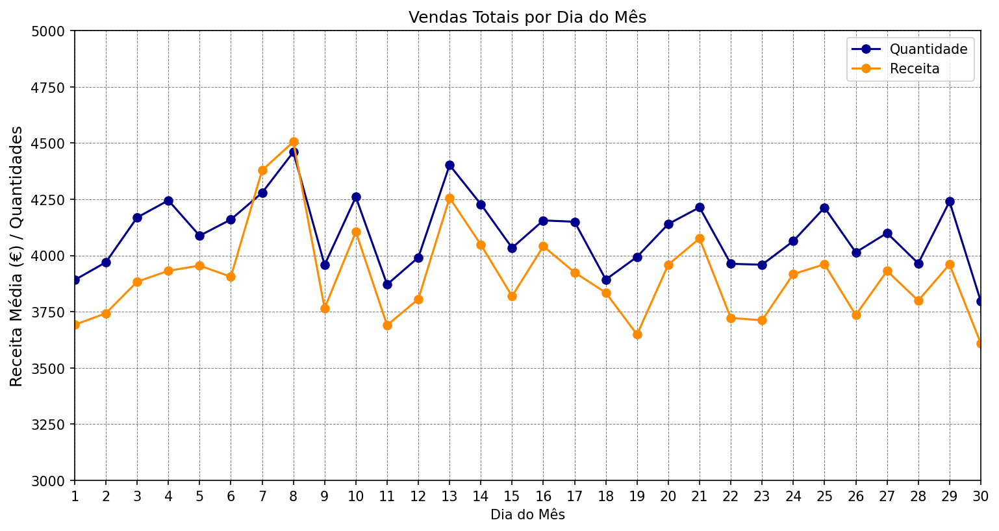

In [92]:
plt.figure(figsize=(12, 6), dpi = 150)

# Plot das quantidades totais por dia do mês
plt.plot(qtd_dia_mes.index, qtd_dia_mes.values,  marker='o', color = 'darkblue', linestyle='-', label = "Quantidade")

# Plot das receitas totais por dia do mês
plt.plot(receita_dia_mes.index, receita_dia_mes.values, marker='o', color = 'darkorange', linestyle='-', label = "Receita")

plt.xlabel('Dia do Mês')
plt.ylabel(f'Receita Média (€) / Quantidades', fontsize=12)
plt.title('Vendas Totais por Dia do Mês')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.xticks(qtd_dia_mes.index,qtd_dia_mes.index)
plt.xlim(1,30)

plt.ylim(3000,5000)
plt.show()

* Não parece haver nenhuma sazonalidade, apenas ruído associado (provavelmente) a alguns eventos extremos (domingos, festividades) na nossa série temporal


#### Valores Médios, Mínimos e Máximos

In [95]:
receita_media_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').mean()
qtd_media_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['Quantity'].sum().groupby('day').mean()

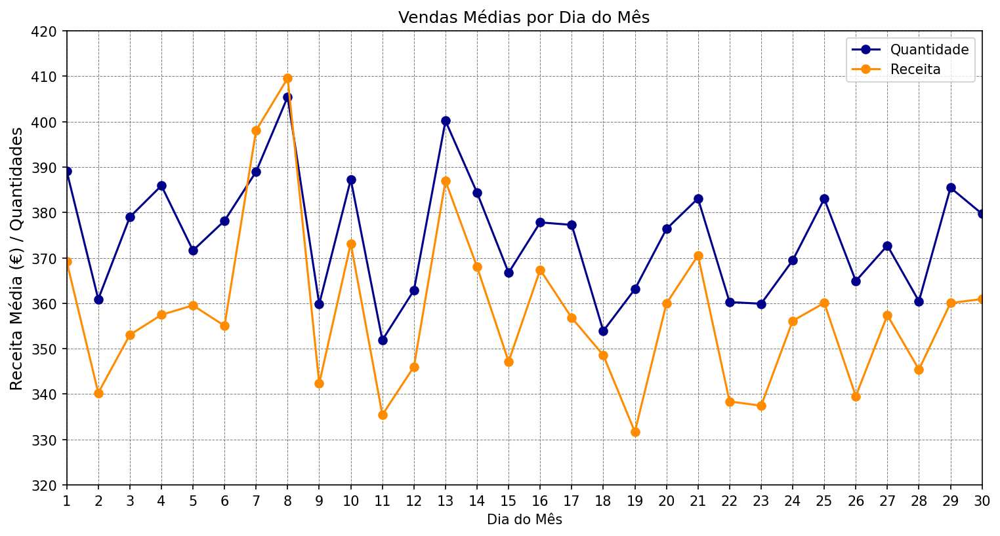

In [96]:
plt.figure(figsize=(12, 6), dpi = 150)

# Plot das quantidades medias por dia do mês
plt.plot(qtd_media_dia_mes.index, qtd_media_dia_mes.values,  marker='o', color = 'darkblue', linestyle='-', label = "Quantidade")

# Plot das receitas medias por dia do mês
plt.plot(receita_media_dia_mes.index, receita_media_dia_mes.values, marker='o', color = 'darkorange', linestyle='-', label = "Receita")

plt.xlabel('Dia do Mês')
plt.ylabel(f'Receita Média (€) / Quantidades', fontsize=12)
plt.title('Vendas Médias por Dia do Mês')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.yticks([y for y in range(320,430,10)],[y for y in range(320,430,10)])
plt.ylim(320,420)

plt.xticks(qtd_dia_mes.index,qtd_dia_mes.index)
plt.xlim(1,30)

#plt.ylim(3000,5000)
plt.show()

* Na receita parece haver um pequeno máximo médio (410€) no dia 7, mas como a amostragem é pequena e sabemos que esse foi um dos dias extremos (festividades) é conveniente olhar para a mediana e distribuição de valores global. 

In [98]:
min_receita_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').min()
max_receita_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').max()
mediana_receita_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['NetTotal'].sum().groupby('day').median()

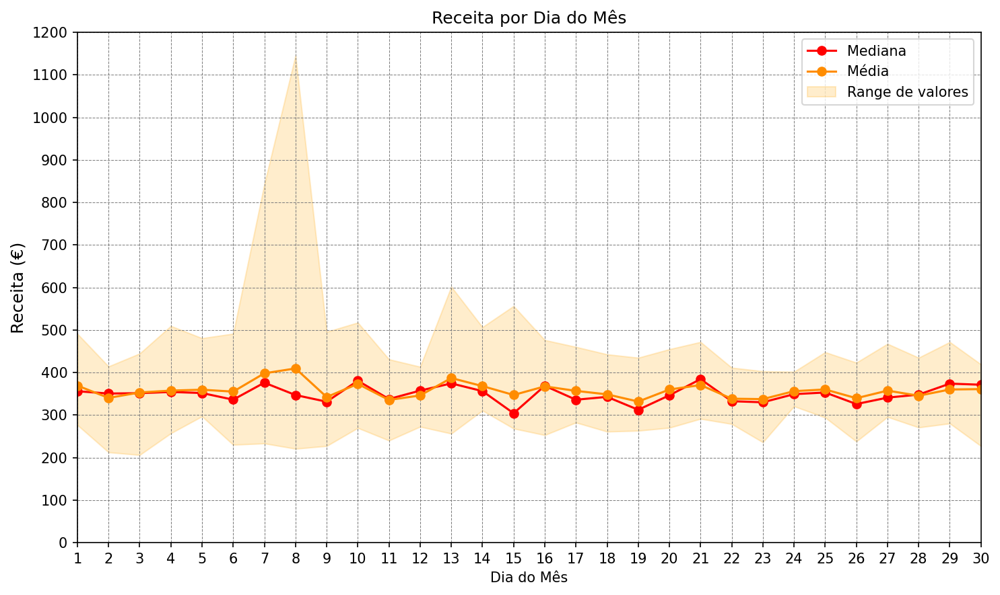

In [99]:
plt.figure(figsize=(10, 6), dpi = 150)

# Plot da mediana das receitas por dia do mês
plt.plot(mediana_receita_dia_mes.index, mediana_receita_dia_mes.values,  marker='o', color = 'red', linestyle='-', label = "Mediana")

# Plot das receitas médias por dia do mês
plt.plot(receita_media_dia_mes.index, receita_media_dia_mes.values, marker='o', color = 'darkorange', linestyle='-', label = "Média")

plt.fill_between(receita_media_dia_mes.index, min_receita_dia_mes, max_receita_dia_mes, color = 'orange', alpha = 0.2, label = 'Range de valores')
 
plt.xlabel('Dia do Mês')
plt.ylabel(f'Receita (€)', fontsize=12)
plt.title('Receita por Dia do Mês')

plt.xticks(receita_media_dia_mes.index,receita_media_dia_mes.index)
plt.xlim(1,30)

plt.yticks([y for y in range(0,1300,100)],[y for y in range(0,1300,100)])
plt.ylim(0, 1200)

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.tight_layout()
plt.show()

In [100]:
min_qtd_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['Quantity'].sum().groupby('day').min()
max_qtd_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['Quantity'].sum().groupby('day').max()
mediana_qtd_dia_mes = df_vendas[df_vendas['month']<12].groupby(['day', 'date'])['Quantity'].sum().groupby('day').median()

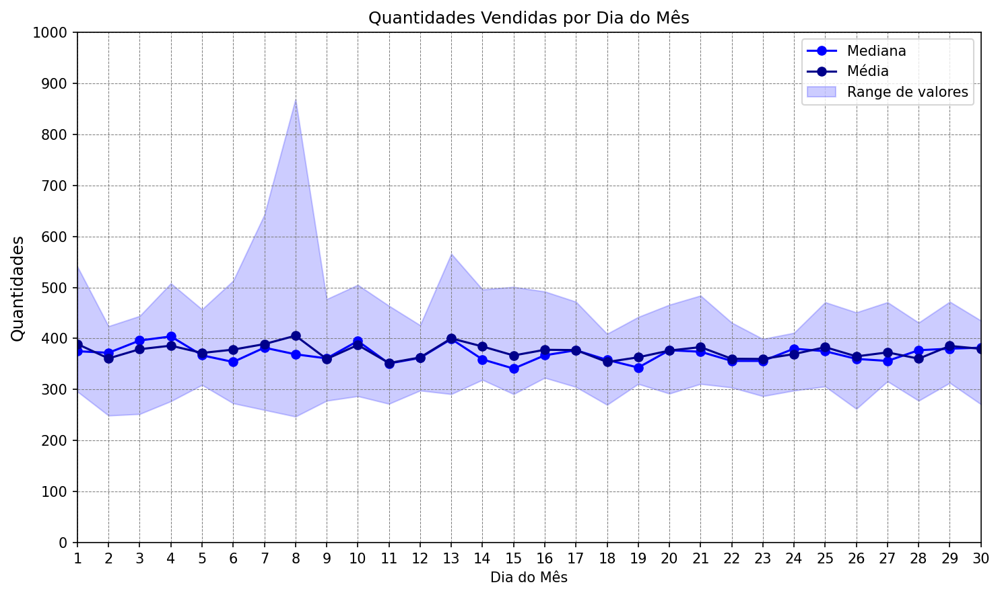

In [101]:
plt.figure(figsize=(10, 6), dpi = 150)

# Plot da mediana das quantidades vendidas por dia do mês
plt.plot(mediana_qtd_dia_mes.index, mediana_qtd_dia_mes.values,  marker='o', color = 'blue', linestyle='-', label = "Mediana")

# Plot das quantidades médias por dia do mês
plt.plot(qtd_media_dia_mes.index, qtd_media_dia_mes.values, marker='o', color = 'darkblue', linestyle='-', label = "Média")

plt.fill_between(qtd_media_dia_mes.index, min_qtd_dia_mes, max_qtd_dia_mes, color = 'blue', alpha = 0.2, label = 'Range de valores')
 
plt.xlabel('Dia do Mês')
plt.ylabel(f'Quantidades', fontsize=12)
plt.title('Quantidades Vendidas por Dia do Mês')

plt.xticks(receita_media_dia_mes.index,receita_media_dia_mes.index)
plt.xlim(1,30)

plt.yticks([y for y in range(0,1100,100)],[y for y in range(0,1100,100)])
plt.ylim(0, 1000)

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.tight_layout()
plt.show()


* Podemos observar que não existe de facto sazonalidade ao longo do mês, e que os valores ligeiramente maiores se devem a valores máximos mais altos, provavelmente associados a domingos, feriados, festividades...

### d) Distribuição de Vendas ao Longo do Ano

Vamos agora analisar como variaram as vendas ao longo do ano 2024 - excluindo Dezembro.

#### Valores Totais

Não faz sentido falar em média, máximo e mínimo quando só temos 1 mês de cada.

In [107]:
receita_mes = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').sum()
qtd_mes = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['Quantity'].sum().groupby('month').sum() 

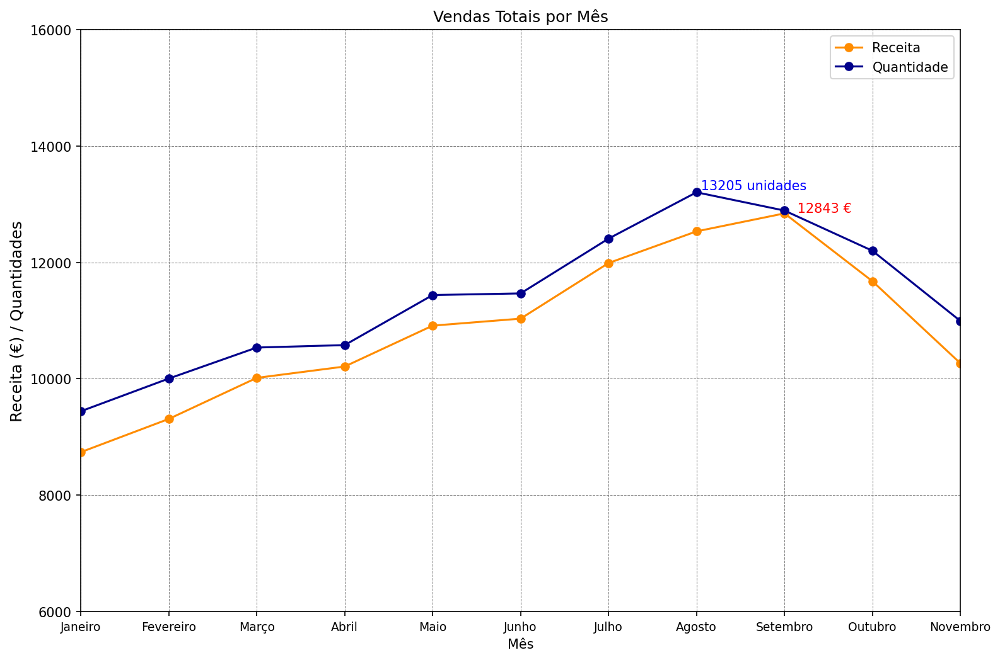

In [108]:
# labels  
nomes_meses = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho', 'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

plt.figure(figsize=(12, 8), dpi = 150)

plt.plot(receita_mes.index, receita_mes.values, marker='o', color = 'darkorange', linestyle='-', label='Receita')
plt.plot(qtd_mes.index, qtd_mes.values, marker='o', color = 'darkblue', linestyle='-', label='Quantidade')

plt.xlabel('Mês')
plt.ylabel(f'Receita (€) / Quantidades', fontsize=12)
plt.title('Vendas Totais por Mês')

plt.xticks([n for n in range(1,13)], nomes_meses, fontsize=9) 
plt.xlim(1, 11)

plt.ylim(6000,16000)

# valor máximo e mes em que ele ocorre
max_qtd = qtd_mes.max()
max_mes_qtd = qtd_mes.idxmax()

# valor máximo e mes em que ele ocorre
max_receita = receita_mes.max()
max_mes_receita = receita_mes.idxmax()

# mostrar o valor máximo na sua coordenada
plt.text(max_mes_receita + 0.1, max_receita - 20, f'{max_receita: .0f} €', ha='left', va = 'bottom', color = 'red')
plt.text(max_mes_qtd, max_qtd, f'{max_qtd: .0f} unidades', ha='left', va = 'bottom', color = 'blue')

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

plt.show()

* Existe um máximo associado às férias de verão em, com uma variação semelhante para as quantidades e receita.
* O máximo das receitas é atingindo apenas em Setembro, práticamente igualando as quantidades, que são por norma superiores.
* O máximo das receitas deve estar associado ao tipo de produtos consumidos durantes as festividades/evento de Setembro.

IVA a Pagar por Mês:
      Mês  IVA a Pagar (€)
  Janeiro           897.42
Fevereiro           994.79
    Março          1075.27
    Abril          1101.23
     Maio          1171.66
    Junho          1179.42
    Julho          1296.02
   Agosto          1348.84
 Setembro          1330.26
  Outubro          1267.58
 Novembro          1109.64

Total de IVA (Jan-Nov): 12772.13€
Média mensal de IVA: 1161.10€


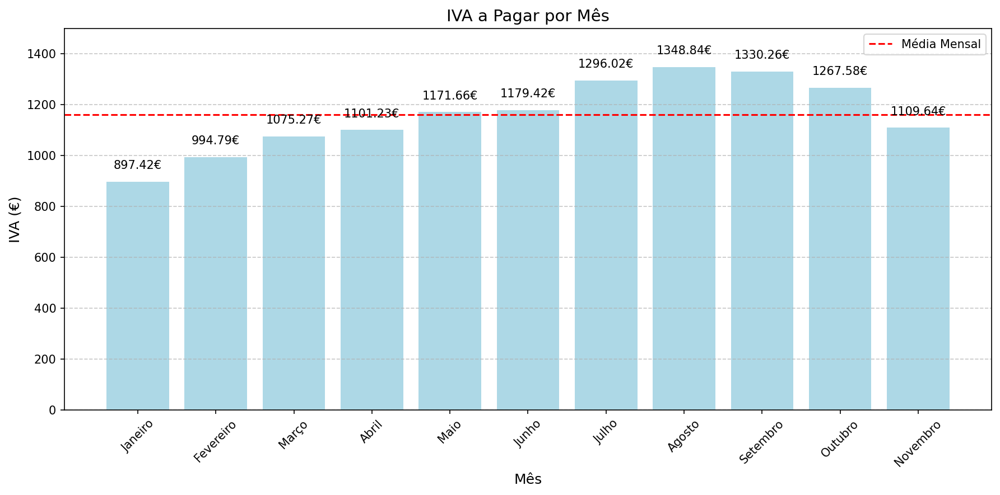

In [110]:
# Total IVA por mês (fora dezembro)

iva_mensal = df_vendas[df_vendas['month'] != 12].groupby('month')['TaxPayable'].sum().round(2)

meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 
    5: 'Maio', 6: 'Junho', 7: 'Julho', 8: 'Agosto',
    9: 'Setembro', 10: 'Outubro', 11: 'Novembro'
}

iva_df = pd.DataFrame({
    'Mês': [meses[m] for m in iva_mensal.index],
    'IVA a Pagar (€)': iva_mensal.values
})

print("IVA a Pagar por Mês:")
print(iva_df.to_string(index=False))
print(f"\nTotal de IVA (Jan-Nov): {iva_mensal.sum():.2f}€")
print(f"Média mensal de IVA: {iva_mensal.mean():.2f}€")

plt.figure(figsize=(12, 6), dpi=150)
plt.bar(range(1, 12), iva_mensal.values, color='lightblue')
plt.axhline(y=iva_mensal.mean(), color='red', linestyle='--', label='Média Mensal')

plt.title('IVA a Pagar por Mês', fontsize=14)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('IVA (€)', fontsize=12)

plt.ylim(0,1500)
plt.xticks(range(1, 12), [meses[m] for m in range(1, 12)], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

for i, v in enumerate(iva_mensal.values):
    plt.text(i + 1, v + 50, f'{v:.2f}€', ha='center')

plt.tight_layout()
plt.show()

Receita Mensal:
      Mês  Receita (€)
  Janeiro      8739.17
Fevereiro      9309.99
    Março     10015.67
    Abril     10210.87
     Maio     10913.50
    Junho     11033.65
    Julho     11989.03
   Agosto     12533.58
 Setembro     12842.50
  Outubro     11676.64
 Novembro     10266.80

Total de receita (Jan-Nov): 119531.40€
Média mensal de receita: 10866.49€


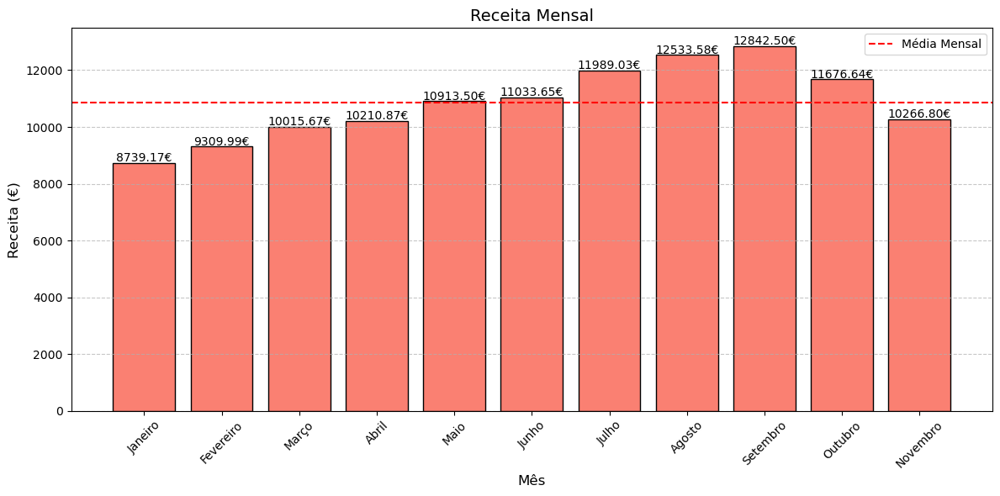

In [111]:
# Total IVA por mês (fora dezembro)
receita_mensal = df_vendas[df_vendas['month'] != 12].groupby('month')['NetTotal'].sum().round(2)

meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 
    5: 'Maio', 6: 'Junho', 7: 'Julho', 8: 'Agosto',
    9: 'Setembro', 10: 'Outubro', 11: 'Novembro'
}

receita_df = pd.DataFrame({
    'Mês': [meses[m] for m in receita_mensal.index],
    'Receita (€)': receita_mensal.values
})

print("Receita Mensal:")
print(receita_df.to_string(index=False))
print(f"\nTotal de receita (Jan-Nov): {receita_mensal.sum():.2f}€")
print(f"Média mensal de receita: {receita_mensal.mean():.2f}€")

plt.figure(figsize=(12, 6))
plt.bar(range(1, 12), receita_mensal.values, color='salmon', edgecolor='black')
plt.axhline(y=receita_mensal.mean(), color='red', linestyle='--', label='Média Mensal')

plt.title('Receita Mensal', fontsize=14)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Receita (€)', fontsize=12)
plt.xticks(range(1, 12), [meses[m] for m in range(1, 12)], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

for i, v in enumerate(receita_mensal.values):
    plt.text(i + 1, v + 50, f'{v:.2f}€', ha='center')

plt.tight_layout()
plt.show()

* O máximo de IVA a pagar é em Agosto apesar de as receitas terem sido maiores em Setembro
* O IVA é $\approx$10%

#### Valores Médios, Medianas, Máximos e Mínimos Diários para cada mês

In [114]:
receita_media_mes = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').mean()
qtd_media_mes = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['Quantity'].sum().groupby('month').mean() 

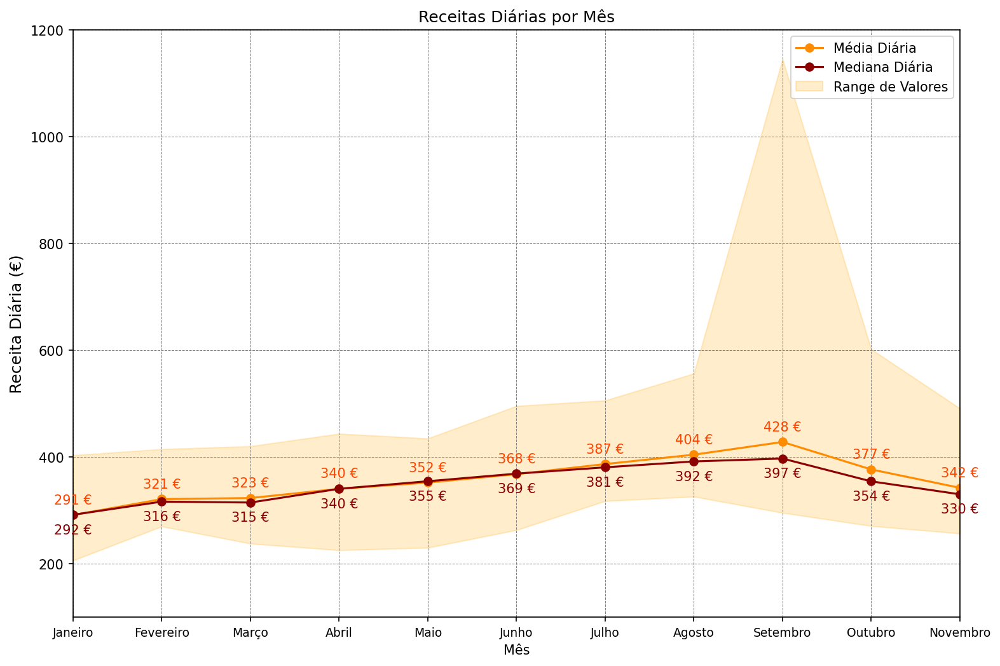

In [115]:
receita_mes_mediana = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').median()
receita_mes_min = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').min()
receita_mes_max = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').max()

# labels
nomes_meses = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho', 'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

plt.figure(figsize=(12, 8), dpi = 150)

plt.plot(receita_media_mes.index, receita_media_mes.values, marker='o', color = 'darkorange', linestyle='-', label='Média Diária')
plt.plot(receita_mes_mediana.index, receita_mes_mediana.values, marker='o', color = 'darkred', linestyle='-', label='Mediana Diária')

plt.fill_between(receita_media_mes.index, receita_mes_min, receita_mes_max, color = 'orange', alpha = 0.2, label = 'Range de Valores')

plt.xlabel('Mês')
plt.ylabel(f'Receita Diária (€)', fontsize=12)
plt.title('Receitas Diárias por Mês')

plt.xticks([n for n in range(1,13)], nomes_meses, fontsize=9) 
plt.xlim(1, 11)

plt.ylim(100,1200)

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

# mostrar o valor na sua coordenada
for x, y in zip(receita_media_mes.index, receita_media_mes.values):
    plt.text(x, y + 40, f'{y:.0f} €', ha='center', va='top', color='orangered')
    
for x, y in zip(receita_mes_mediana.index, receita_mes_mediana.values):
    plt.text(x, y - 40, f'{y:.0f} €', ha='center', va ='bottom', color='darkred')

plt.show()

* A mediana de **receitas diárias** da padaria varia entre 292€ e 330€ ao longo do ano
* Os valores máximos *desviam* mais em Agosto / Outubro / Novembro (excluindo Setembro)
* O pico está associado ao evento entre 6 e 9 de Setembro
* Máximos ao longo do ano associados a fins de semana.
* Mínimos associados a terça / quarta-feira.

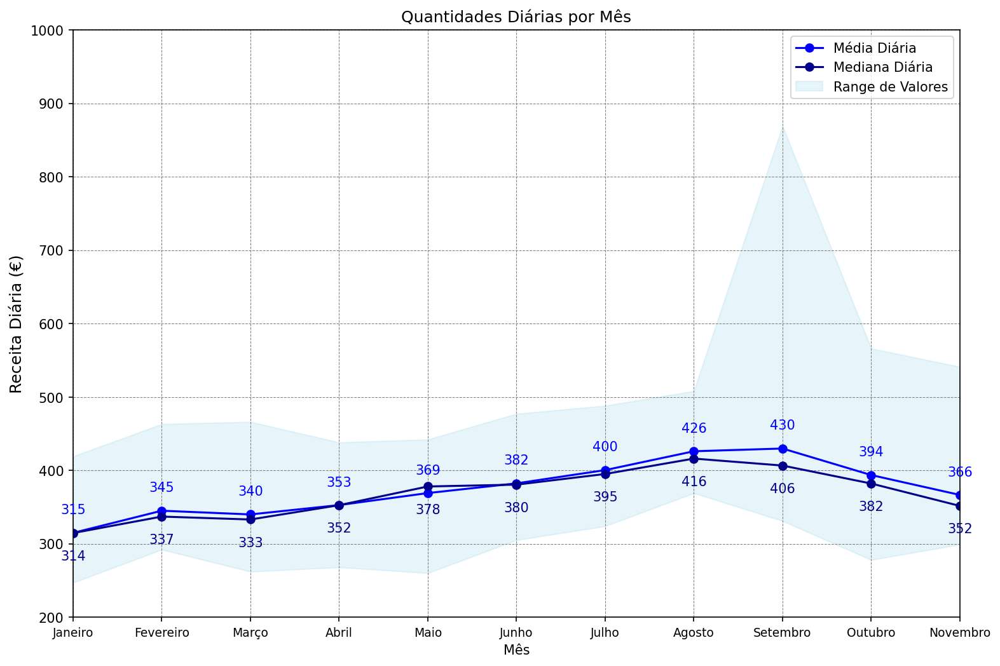

In [117]:
qtd_mes_mediana = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['Quantity'].sum().groupby('month').median()
qtd_mes_min = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['Quantity'].sum().groupby('month').min()
qtd_mes_max = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['Quantity'].sum().groupby('month').max()

# labels
nomes_meses = ['Janeiro', 'Fevereiro', 'Março', 'Abril', 'Maio', 'Junho', 'Julho', 'Agosto', 'Setembro', 'Outubro', 'Novembro', 'Dezembro']

plt.figure(figsize=(12, 8), dpi = 150)

plt.plot(qtd_media_mes.index, qtd_media_mes.values, marker='o', color = 'blue', linestyle='-', label='Média Diária')
plt.plot(qtd_mes_mediana.index, qtd_mes_mediana.values, marker='o', color = 'darkblue', linestyle='-', label='Mediana Diária')

plt.fill_between(qtd_media_mes.index, qtd_mes_min, qtd_mes_max, color = 'skyblue', alpha = 0.2, label = 'Range de Valores')

plt.xlabel('Mês')
plt.ylabel(f'Receita Diária (€)', fontsize=12)
plt.title('Quantidades Diárias por Mês')

plt.xticks([n for n in range(1,13)], nomes_meses, fontsize=9) 
plt.xlim(1, 11)

plt.ylim(200,1000)

plt.grid(color='gray', linestyle='--', linewidth=0.5)
plt.legend()

# mostrar o valor na sua coordenada
for x, y in zip(qtd_media_mes.index, qtd_media_mes.values):
    plt.text(x, y + 40, f'{y:.0f}', ha='center', va='top', color='blue')
    
for x, y in zip(qtd_mes_mediana.index, qtd_mes_mediana.values):
    plt.text(x, y - 40, f'{y:.0f}', ha='center', va ='bottom', color='darkblue')

plt.show()

* A mediana de **quantidades vendidas por dia** da padaria varia entre 314 e 416 ao longo do ano.
* Os valores máximos *desviam* mais em  Outubro / Novembro e Fevereiro / Março (excluindo Setembro)
* O pico está associado ao evento entre 6 e 9 de Setembro, mas é menos acentuado que para nas receitas
* Máximos ao longo do ano associados a fins de semana.
* Mínimos associados a segunda / quarta-feira.

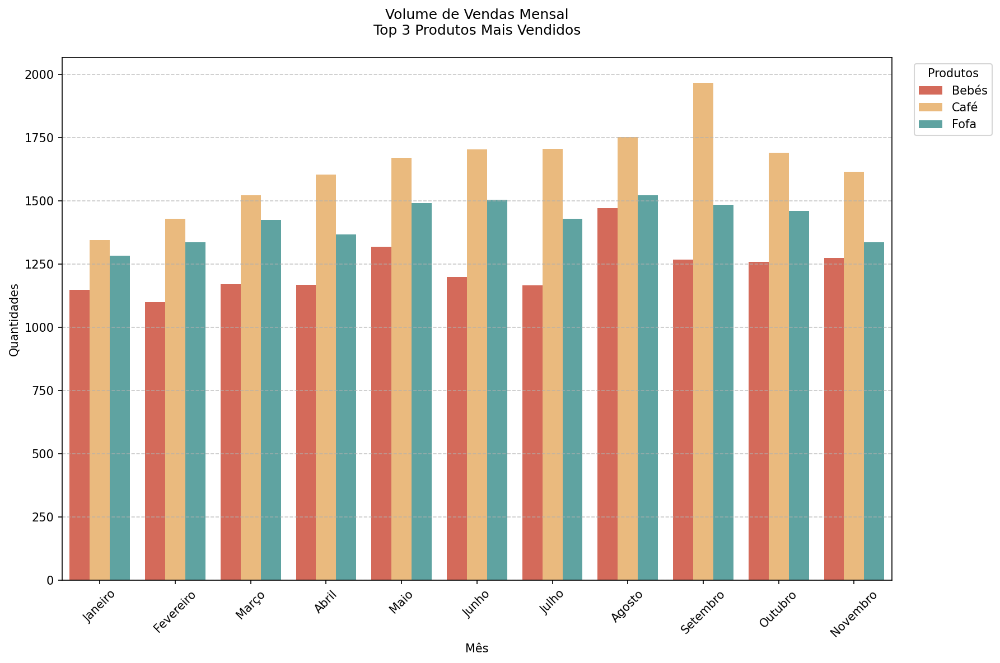

In [119]:
# Por hora do dia
hourly_sales = df_vendas.groupby(['hour', 'Description42'])['Quantity'].sum().reset_index()
top3_products = df_vendas.groupby('Description42')['Quantity'].sum()\
    .sort_values(ascending=False).head(3)

# Filtrar apenas horas entre 6 e 21
hourly_top3 = hourly_sales[hourly_sales['Description42'].isin(top3_products.index)]
hourly_top3 = hourly_top3[hourly_top3['hour'].between(6, 21)]\
    .sort_values(['hour', 'Quantity'])

# Por mes do ano
monthly_data = df_vendas[df_vendas['month'] <= 11]
monthly_top3 = monthly_data[monthly_data['Description42'].isin(top3_products.index)]\
    .groupby(['month', 'Description42'])['Quantity'].sum().reset_index()

# Mapa de meses
meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril',
    5: 'Maio', 6: 'Junho', 7: 'Julho', 8: 'Agosto',
    9: 'Setembro', 10: 'Outubro', 11: 'Novembro'
}
monthly_top3['month'] = monthly_top3['month'].map(meses)

colors = ['#e95b45', '#fcbc6c', '#54aeac']
plt.figure(figsize=(12, 8), dpi=150)

# Evolução mensal
sns.barplot(data=monthly_top3, x='month', y='Quantity', hue='Description42', palette=colors)
plt.title('Volume de Vendas Mensal\nTop 3 Produtos Mais Vendidos', 
          pad=20, fontsize=12)
plt.xlabel('Mês', fontsize=10)
plt.ylabel('Quantidades', fontsize=10)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Produtos', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

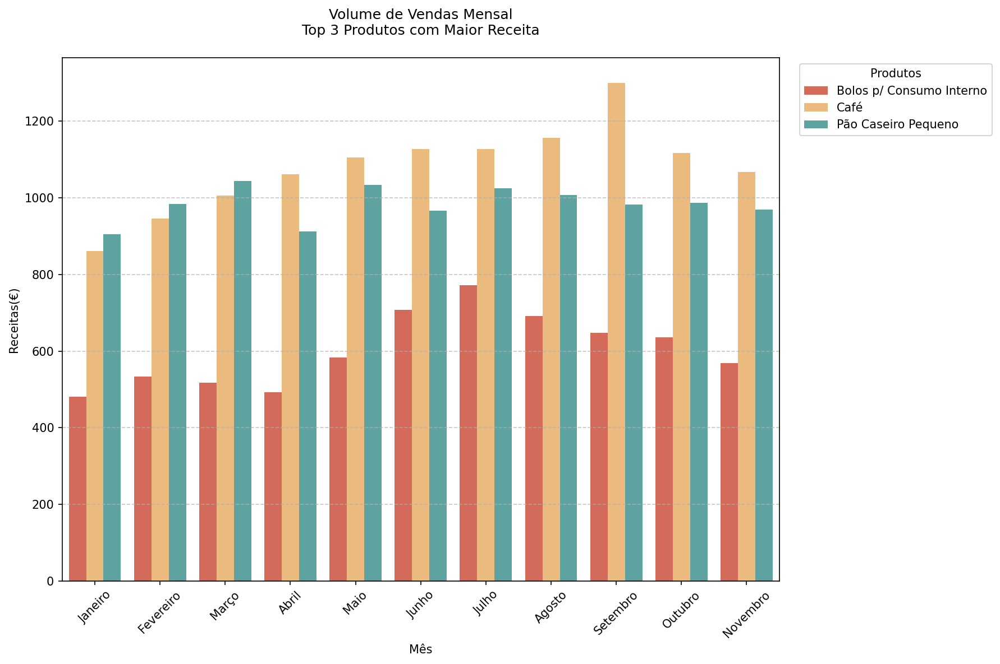

In [191]:
# Por hora do dia
hourly_sales = df_vendas.groupby(['hour', 'Description42'])['NetTotal'].sum().reset_index()
top3_products = df_vendas.groupby('Description42')['NetTotal'].sum()\
    .sort_values(ascending=False).head(3)

# Filtrar apenas horas entre 6 e 21
hourly_top3 = hourly_sales[hourly_sales['Description42'].isin(top3_products.index)]
hourly_top3 = hourly_top3[hourly_top3['hour'].between(6, 21)]\
    .sort_values(['NetTotal', 'NetTotal'])

# Por mes do ano
monthly_data = df_vendas[df_vendas['month'] <= 11]
monthly_top3 = monthly_data[monthly_data['Description42'].isin(top3_products.index)]\
    .groupby(['month', 'Description42'])['NetTotal'].sum().reset_index()

# Mapa de meses
meses = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril',
    5: 'Maio', 6: 'Junho', 7: 'Julho', 8: 'Agosto',
    9: 'Setembro', 10: 'Outubro', 11: 'Novembro'
}
monthly_top3['month'] = monthly_top3['month'].map(meses)

colors = ['#e95b45', '#fcbc6c', '#54aeac']
plt.figure(figsize=(12, 8), dpi=150)

# Evolução mensal
sns.barplot(data=monthly_top3, x='month', y='NetTotal', hue='Description42', palette=colors)
plt.title('Volume de Vendas Mensal\nTop 3 Produtos com Maior Receita', 
          pad=20, fontsize=12)
plt.xlabel('Mês', fontsize=10)
plt.ylabel('Receitas(€)', fontsize=10)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Produtos', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

* O café tem uma sazonalidade clara ao longo do ano - mais popular quando há bom tempo
* Máximo dominante em Setembro - nas festas

## 4.2. Produtos

Nota:
* Menú Normal = Nata + Café 
* Menú Especial = Galão + Pão (com fiambre / queijo)


In [124]:
# Filtrar apenas os produtos da categoria "Padaria","Pastelaria", "Bebidas e "Cafetaria"
pad_past_caf = df_vendas[df_vendas['ProductCategory'].isin(['Padaria', 'Pastelaria','Cafetaria', 'Bebidas'])]

# Filtrar apenas os produtos da categoria "Mercearia"
mercearia = df_vendas[df_vendas['ProductCategory'].isin(['Mercearia'])]

# Filtrar apenas os produtos da categoria "Bebidas e Tabaco"
bebidas_tabaco = df_vendas[df_vendas['ProductCategory'].isin(['Bebidas Espirituosas','Bebidas Alcólicas','Tabaco'])]

### a) Vendas por Categoria

#### Quantidades

In [127]:
# Agrupar por ano e categoria, somar as quantidades
categoria_por_ano = df_vendas.groupby(["ProductCategory"])["Quantity"].sum()
categoria_por_ano_percent = (categoria_por_ano / categoria_por_ano.sum() * 100).round(2)
categoria_por_ano_percent

ProductCategory
Bebidas                  4.38
Bebidas Alcoolicas       6.62
Bebidas Espirituosas     1.46
Cafetaria               18.62
Diversos                 0.94
Mercearia                4.66
Padaria                 46.86
Pastelaria               9.08
Refeições                4.60
Tabaco                   2.78
Name: Quantity, dtype: float64

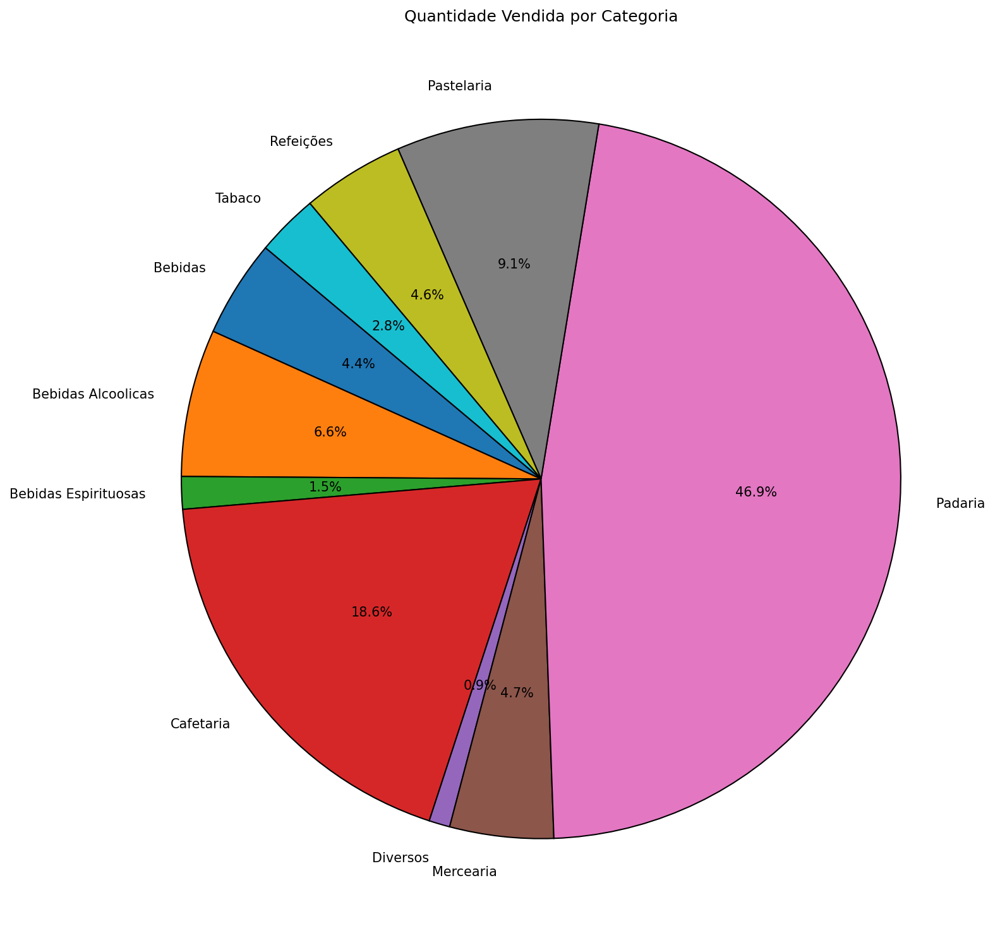

In [128]:
# Dados para o gráfico de pizza
categorias = categoria_por_ano_percent.index

# Criar o gráfico
plt.figure( figsize=(12,10), dpi = 150) 
plt.pie(categoria_por_ano_percent, labels=categorias, autopct='%1.1f%%', startangle=140, wedgeprops={"edgecolor": "black", "linewidth":1})
plt.title("Quantidade Vendida por Categoria", fontsize=12)
plt.tight_layout()
plt.show()

* Os produtos comprados em maior quantidade são da padaria (fofa e bebés como podemos ver abaixo)
* De seguida, temos a cafetaria - com a venda de cafés essencialmente
* Somando Cafetaria + Padaria + Pastelaria temos 76.8% da quantidade vendida   

#### Receitas

In [131]:
# Agrupar por ano e categoria, somar as quantidades
categoria_ano = df_vendas.groupby(["ProductCategory"])["NetTotal"].sum()
categoria_ano_percent = (categoria_ano / categoria_ano.sum() * 100).round(2)
categoria_ano_percent

ProductCategory
Bebidas                  4.87
Bebidas Alcoolicas       6.71
Bebidas Espirituosas     1.67
Cafetaria               13.89
Diversos                 0.64
Mercearia                8.20
Padaria                 30.57
Pastelaria              11.13
Refeições                7.71
Tabaco                  14.60
Name: NetTotal, dtype: float64

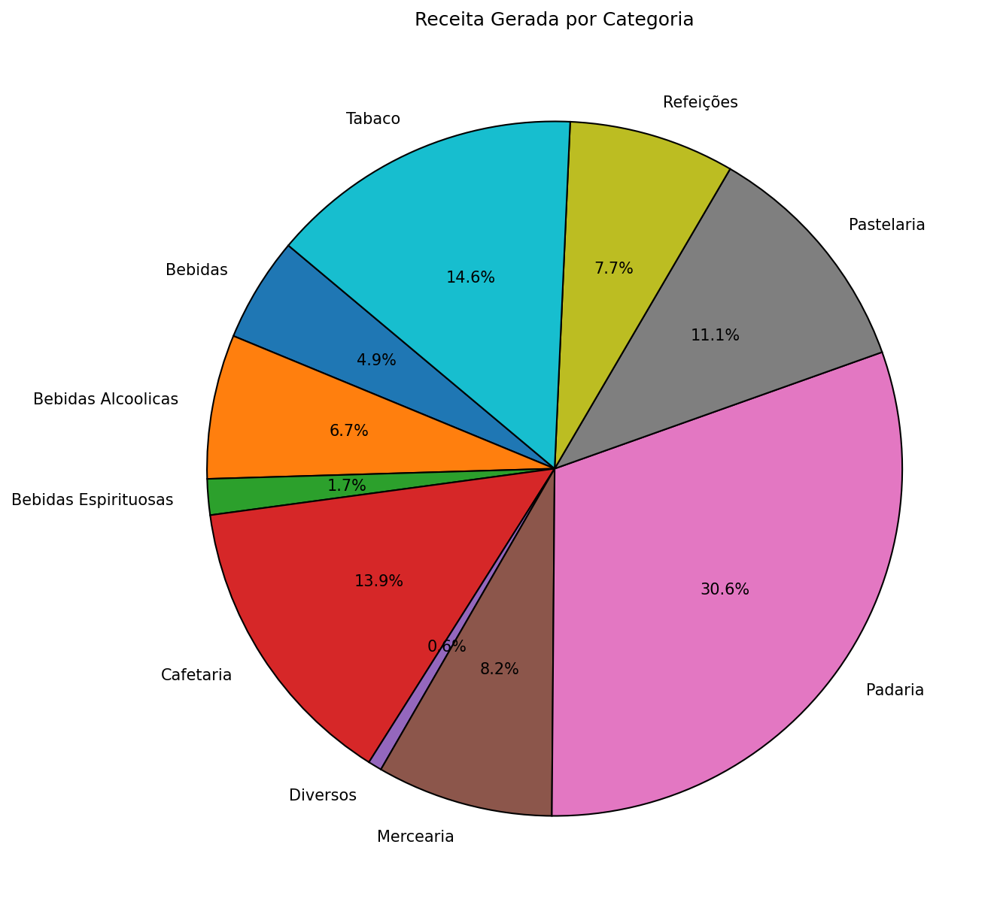

In [132]:
# Dados para o gráfico de pizza
categorias_receita = categoria_ano_percent.index

# Criar o gráfico
plt.figure(figsize=(12,10), dpi=150)
plt.pie(categoria_ano_percent, labels=categorias_receita, autopct='%1.1f%%', startangle=140, wedgeprops={"edgecolor": "black", "linewidth":1})
plt.title("Receita Gerada por Categoria", fontsize=12)
plt.show()

* Os produtos que geram maior receita são de longe da padaria (pão caseiro e fofas)
* De seguida, temos o tabaco com muito maior representatividade vs quantidades vendidas
* Seguido temos a pastelaria e cafetaria ($\approx$14% cada)

### b) Quantidades Vendidas 

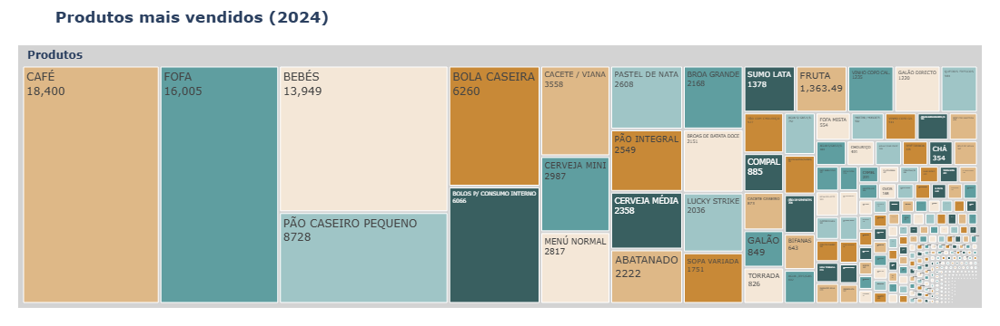

In [135]:
fig = px.treemap(data_frame=df_vendas, 
                path=[px.Constant('<b> Produtos'), 
                      'ProductDescription41'], 
                title = '<b> Produtos mais vendidos (2024)',
                values= 'Quantity')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['burlywood', 'cadetblue'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()

#### Padaria, Pastelaria e Cafetaria

In [137]:
# Agrupar por produto e somar as quantidades
pad_past_caf_mais_vendidos = pad_past_caf.groupby('ProductDescription41')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
pad_past_caf_mais_vendidos = pad_past_caf_mais_vendidos.sort_values(ascending=False)

In [138]:
# Mostrar os top 10 produtos mais vendidos
print(pad_past_caf_mais_vendidos.head(10))

ProductDescription41
CAFÉ                        18400.0
FOFA                        16005.0
BEBÉS                       13949.0
PÃO CASEIRO PEQUENO          8728.0
BOLA CASEIRA                 6260.0
BOLOS P/ CONSUMO INTERNO     6066.0
CACETE / VIANA               3558.0
PASTEL DE NATA               2608.0
PÃO INTEGRAL                 2549.0
ABATANADO                    2222.0
Name: Quantity, dtype: float64


In [139]:
# Mostrar os top 10 produtos menos vendidos
print(pad_past_caf_mais_vendidos.tail(10))

ProductDescription41
SUMOL L,1,5L  ANANAS         1.0
BOLO MIL FOLHAS              1.0
COSCORÃO                     1.0
DOCE DE PESSEGO              1.0
BROAS DE MEL E PINHAO        1.0
LIPTON 1,5L MANGA            1.0
BROAS DE MEL                 1.0
LEITE ACHOCOLATADO           1.0
LIPTON                       1.0
FILHÓS NORMAL COM ABÓBORA    1.0
Name: Quantity, dtype: float64


#### Mercearia

In [141]:
# Agrupar por produto e somar as quantidades
mercearia_mais_vendidos = mercearia.groupby('ProductDescription41')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
mercearia_mais_vendidos = mercearia_mais_vendidos.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(mercearia_mais_vendidos.head(10))

ProductDescription41
FRUTA                     1363.49
QUEIJOS FRESCOS            981.00
CHOURIÇO                   401.00
OVOS                       168.00
QUEIJOS CURADOS MÉDIOS     155.00
B FRITA                    148.00
CHOURICAO                  147.00
SACO PLASTICO              129.00
SALSICHAS                  128.00
LITRO DE LEITE             119.00
Name: Quantity, dtype: float64


#### Bebidas Espirituosas, Bebidas Alcólicas e Tabaco

In [143]:
# Agrupar por produto e somar as quantidades
bebidas_tabaco_mais_vendidos = bebidas_tabaco.groupby('ProductDescription41')['Quantity'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
bebidas_tabaco_mais_vendidos = bebidas_tabaco_mais_vendidos.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(bebidas_tabaco_mais_vendidos.head(10))

ProductDescription41
LUCKY STRIKE               2036.0
MARTINI / MOSCATEL          532.0
CHESTERFIELD AZUL           305.0
MEIO MARTINI / MOSCATEL     271.0
MEIA AGUARDENTE             271.0
CAMEL                       201.0
MARLBORO                    192.0
V. PORTO TINTO              186.0
WINSTON 100                 184.0
MEIO BRANDY CROFT           118.0
Name: Quantity, dtype: float64


In [144]:
# Mostrar os top 10 produtos menos vendidos
print(bebidas_tabaco_mais_vendidos.tail(10))

ProductDescription41
CHESTERFIELD ORIGINAL     5.0
MEIO WHISKY CUTTY SARK    3.0
PORTUGUES SOFT            3.0
CHEST. VERMELHO           3.0
WINSTON AZUL              3.0
MARBLBORO 100S            2.0
KARELIA                   2.0
MEIO SAFARI               1.0
TABACO WEST               1.0
GIN                       1.0
Name: Quantity, dtype: float64


### c) Receitas

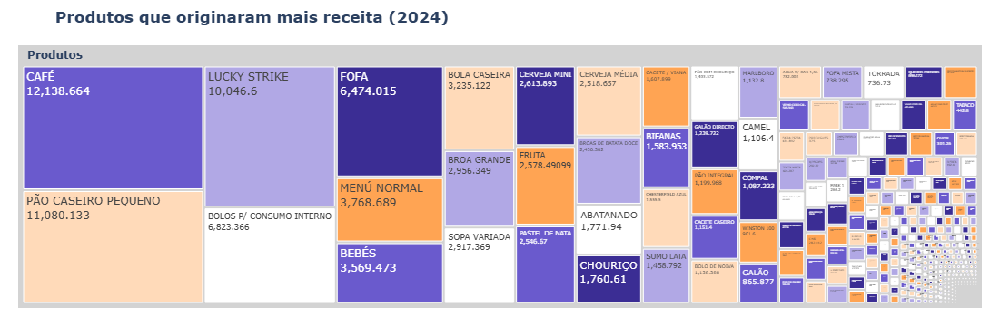

In [146]:
fig = px.treemap(data_frame=df_vendas, 
                path=[px.Constant('<b> Produtos'), 
                      'ProductDescription41'], 
                title = '<b> Produtos que originaram mais receita (2024)',
                values='NetTotal')

fig.data[0].textinfo = 'label+text+value'

fig.update_traces(root_color='lightgrey')
 
fig.update_layout(treemapcolorway = ['slateblue', 'peachpuff'], 
                  margin = dict(t=50, l=20, r=20, b=20))

fig.layout.hovermode = False
fig.show()

#### Padaria, Pastelaria e Cafetaria

In [148]:
# Agrupar por produto e somar as quantidades
produtos_maior_receita = pad_past_caf.groupby('ProductDescription41')['NetTotal'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
produtos_maior_receita = produtos_maior_receita.sort_values(ascending=False)

# Mostrar os top 10 produtos com mais receita
print(produtos_maior_receita.head(10))

ProductDescription41
CAFÉ                        12138.664
PÃO CASEIRO PEQUENO         11080.133
BOLOS P/ CONSUMO INTERNO     6823.366
FOFA                         6474.015
BEBÉS                        3569.473
BOLA CASEIRA                 3235.122
BROA GRANDE                  2956.349
PASTEL DE NATA               2546.670
BROAS DE BATATA DOCE         2430.302
ABATANADO                    1771.940
Name: NetTotal, dtype: float64


In [149]:
# Mostrar os top 10 produtos com menos receita
print(produtos_maior_receita.tail(10))

ProductDescription41
AGUA CARVA.1,5L              1.95
DOCE DE PESSEGO              1.63
SUMOL L,1,5L  ANANAS         1.61
LIPTON                       1.61
LIPTON 1,5L MANGA            1.61
COSCORÃO                     1.54
SONHOS                       1.41
COCA-COLA                    0.98
LEITE ACHOCOLATADO           0.65
FILHÓS NORMAL COM ABÓBORA    0.61
Name: NetTotal, dtype: float64


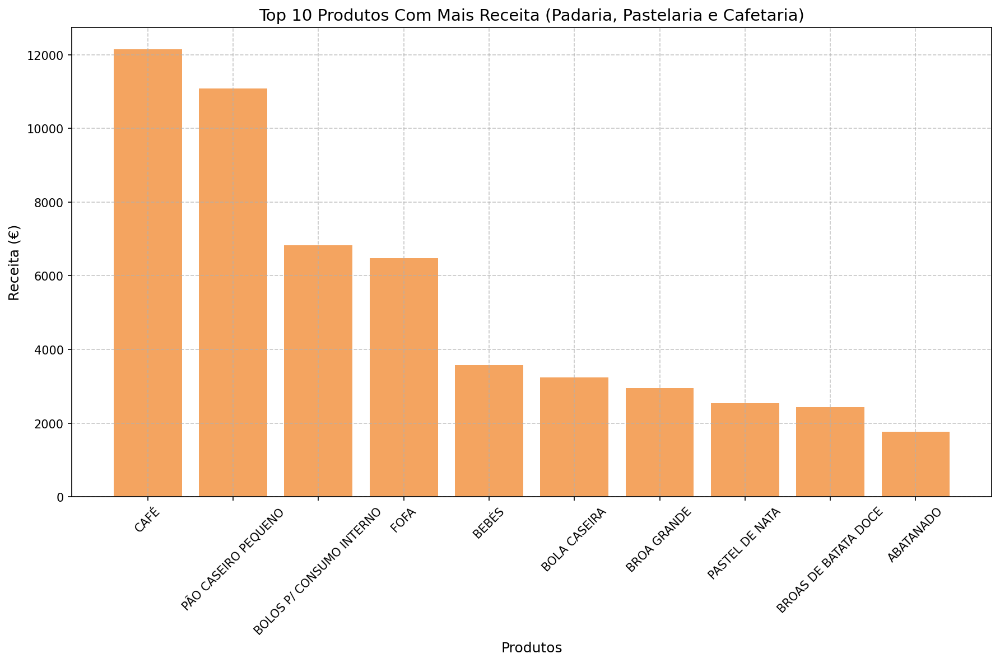

In [150]:
# Selecionar os 10 produtos mais rentáveis
top_10_produtos = produtos_maior_receita.head(10)

# Criar o gráfico de linhas
plt.figure(figsize=(12, 8), dpi = 150)
plt.bar(top_10_produtos.index, top_10_produtos.values, color='sandybrown')

# Adicionar títulos e rótulos
plt.title("Top 10 Produtos Com Mais Receita (Padaria, Pastelaria e Cafetaria)", fontsize=14)
plt.xlabel("Produtos", fontsize=12)
plt.ylabel("Receita (€)", fontsize=12)
plt.xticks(rotation=45)

plt.grid(linestyle="--", alpha=0.7)

# Mostrar o gráfico
plt.tight_layout()
plt.show()

#### Mercearia

In [152]:
# Agrupar por produto e somar as quantidades
mercearia_maior_receita = mercearia.groupby('ProductDescription41')['NetTotal'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
mercearia_maior_receita = mercearia_maior_receita.sort_values(ascending=False)

In [153]:
# Selecionar os 10 produtos mais rentáveis de "Mercearia"
top_10_produtos_mercearia = mercearia_maior_receita.head(10)

In [154]:
# Mostrar os top 10 produtos maior receita
print(mercearia_maior_receita.head(10))

ProductDescription41
FRUTA                        2578.49099
CHOURIÇO                     1760.61000
QUEIJOS FRESCOS               696.17200
OVOS                          301.26000
QUEIJOS CURADOS GRANDES       270.49000
QUEIJOS CURADOS MÉDIOS        268.08000
B FRITA                       192.40000
CHOURICAO                     185.22000
BOLACHAS  WAFERS BAUNILHA     167.20000
MERCEARIA IVA REDUZIDO        141.82000
Name: NetTotal, dtype: float64


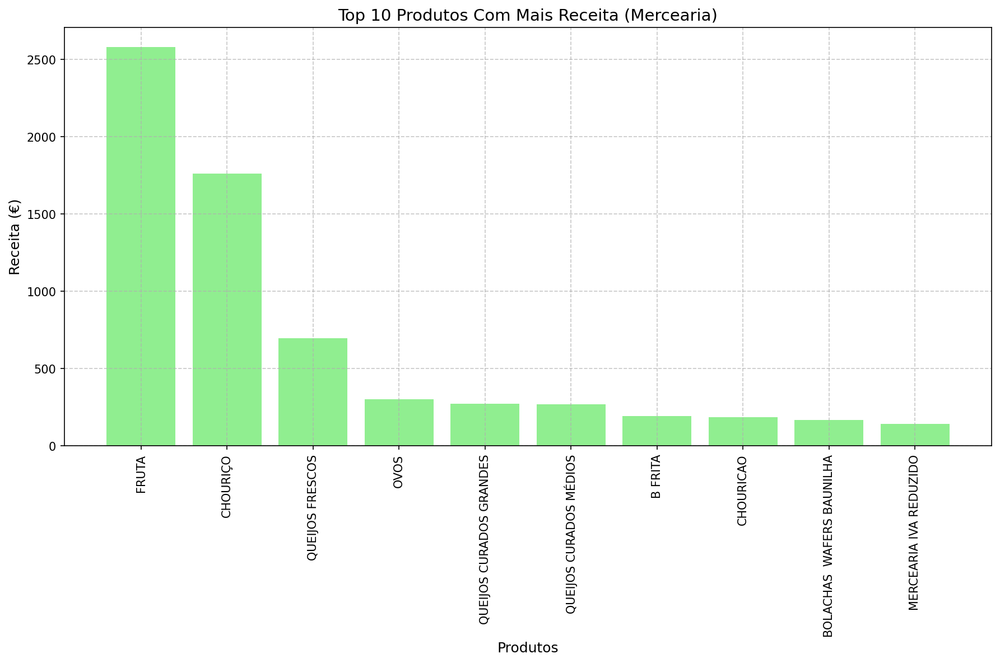

In [155]:
# Criar o gráfico de linhas
plt.figure(figsize=(12, 8), dpi = 150)
plt.bar(top_10_produtos_mercearia.index, top_10_produtos_mercearia.values, color='lightgreen')

# Adicionar títulos e rótulos
plt.title("Top 10 Produtos Com Mais Receita (Mercearia)", fontsize=14)
plt.xlabel("Produtos", fontsize=12)
plt.ylabel("Receita (€)", fontsize=12)
plt.xticks(rotation=90)
plt.grid(linestyle="--", alpha=0.7)

# Mostrar o gráfico
plt.tight_layout()
plt.show()

#### Bebidas, Bebidas Espirituosas, Bebidas Alcoólicas e Tabaco

In [157]:
# Agrupar por produto e somar as quantidades
bebidas_tabaco_maior_receita = bebidas_tabaco.groupby('ProductDescription41')['NetTotal'].sum()

# Ordenar os produtos pela quantidade em ordem decrescente
bebidas_tabaco_maior_receita = bebidas_tabaco_maior_receita.sort_values(ascending=False)

# Mostrar os top 10 produtos mais vendidos
print(bebidas_tabaco_maior_receita.head(10))

ProductDescription41
LUCKY STRIKE             10046.600
CHESTERFIELD AZUL         1555.500
MARLBORO                  1132.800
CAMEL                     1106.400
WINSTON 100                901.600
MARTINI / MOSCATEL         521.051
MARLBORO VERMELHO          513.600
TABACO                     442.800
CHEST. AZUL SOFT PACK      394.300
PORTUGUES                  375.000
Name: NetTotal, dtype: float64


In [158]:
print(bebidas_tabaco_maior_receita.tail(10))

ProductDescription41
WHISKY GRANT'S                  12.670
MARBLBORO 100S                  10.600
KARELIA                         10.000
VODKA                            9.762
AGUARDENTE                       7.800
MEIO WHISKY PASSAPORT SCOTCH     5.370
MEIO WHISKY CUTTY SARK           5.120
TABACO WEST                      5.000
GIN                              2.030
MEIO SAFARI                      1.300
Name: NetTotal, dtype: float64


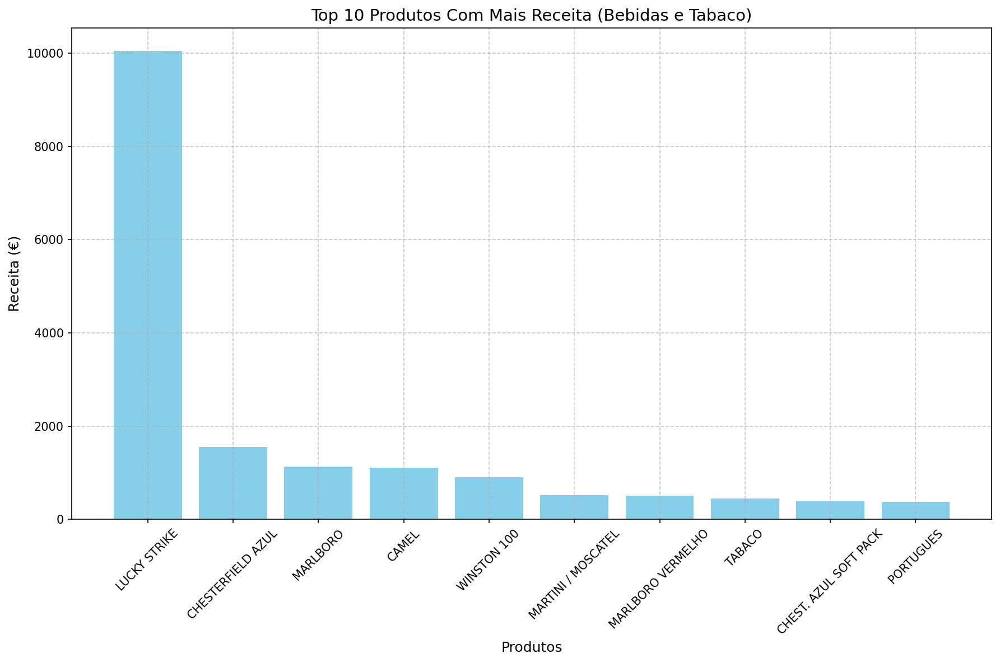

In [159]:
# Selecionar os 10 produtos mais rentáveis
top_10_produtos_tabaco_bebidas = bebidas_tabaco_maior_receita.head(10)

# Criar o gráfico de linhas
plt.figure(figsize=(12, 8), dpi=150)
plt.bar(top_10_produtos_tabaco_bebidas.index, top_10_produtos_tabaco_bebidas.values, color='skyblue')

# Adicionar títulos e rótulos
plt.title("Top 10 Produtos Com Mais Receita (Bebidas e Tabaco)", fontsize=14)
plt.xlabel("Produtos", fontsize=12)
plt.ylabel("Receita (€)", fontsize=12)
plt.xticks(rotation=45)
plt.grid(linestyle="--", alpha=0.7)

# Mostrar o gráfico
plt.tight_layout()
plt.show()

### d) Produtos Comprados em Conjunto

In [161]:
# Agrupar os produtos por data de compra (InvoiceNo)
grouped = df_vendas.groupby('InvoiceNo')['ProductDescription41'].apply(list)

# Gerar combinações únicas de produtos (ordem não importa)
combos = []
for products in grouped:
    # Usar frozenset para garantir que a ordem não influencia
    combos.extend(frozenset(combo) for combo in combinations(products, 3))

# Contar a frequência de cada combinação única
combo_counts = Counter(combos)

# Converter para DataFrame para análise
combo_df = pd.DataFrame(combo_counts.items(), columns=['Conjuntos de Produtos', 'Ocorrências']).sort_values(by='Ocorrências', ascending=False)

# Converter os frozensets de volta para listas para melhor leitura
combo_df['Conjuntos de Produtos'] = combo_df['Conjuntos de Produtos'].apply(lambda x: ", ".join(sorted(x)))

print(combo_df.head(10))

                                 Conjuntos de Produtos  Ocorrências
82                BOLOS P/ CONSUMO INTERNO, CAFÉ, FOFA          475
282                                  BEBÉS, CAFÉ, FOFA          272
280       BOLOS P/ CONSUMO INTERNO, CAFÉ, LUCKY STRIKE          244
160                           CAFÉ, FOFA, LUCKY STRIKE          236
281       BOLOS P/ CONSUMO INTERNO, FOFA, LUCKY STRIKE          207
297                          BEBÉS, CAFÉ, PÃO INTEGRAL          195
86         BOLOS P/ CONSUMO INTERNO, CAFÉ, MENÚ NORMAL          175
292     BOLOS P/ CONSUMO INTERNO, CACETE / VIANA, CAFÉ          168
512         ABATANADO, BEBÉ COM MANTEIGA, PÃO INTEGRAL          164
85   BOLOS P/ CONSUMO INTERNO, CAFÉ, PÃO CASEIRO PE...          145


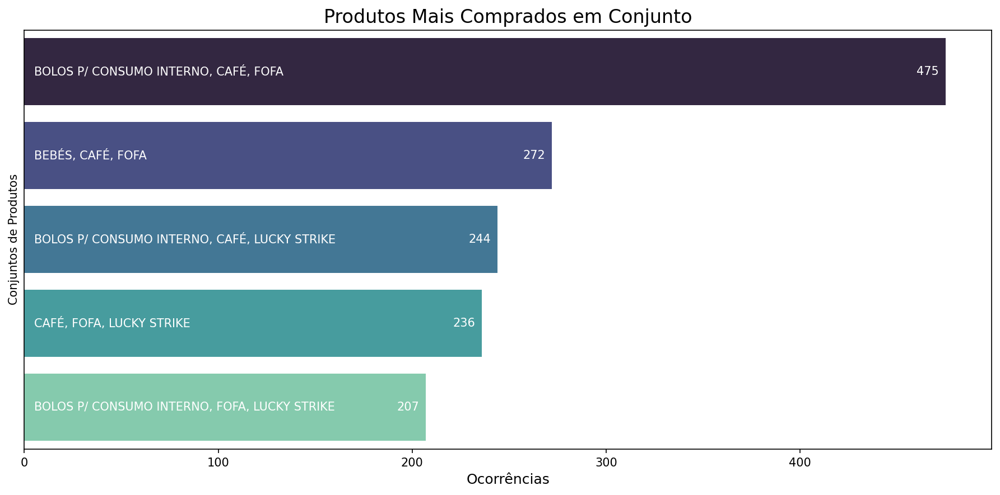

In [195]:
# Selecionar os 5 conjuntos mais comuns
top_5 = combo_df.head(5)

# Criar o gráfico de barras horizontal
plt.figure(figsize=(12, 6), dpi = 150)
sns.barplot(
    x=top_5['Ocorrências'],
    y=top_5['Conjuntos de Produtos'],
    palette="mako")

# Configurar o título e rótulos
plt.title("Produtos Mais Comprados em Conjunto", fontsize=16)
plt.xlabel("Ocorrências", fontsize=12)

# Remover os rótulos padrão do eixo Y
plt.yticks([],fontsize=7)

# Adicionar os rótulos (yticks) manualmente dentro das barras
for index, label in enumerate(top_5['Conjuntos de Produtos']):
    plt.text(x=5, y=index, s=label, va='center', ha='left', fontsize=10, color='white')

# Adicionar valores das ocorrências ao final das barras
for index, value in enumerate(top_5['Ocorrências']):
    plt.text(value - 15 , index, str(value), va='center', ha='left', fontsize=10, color='white')
plt.tight_layout()
plt.show()

* Combinações dominadas por pão, bolos, café e tabaco

### e) IVA de Produtos

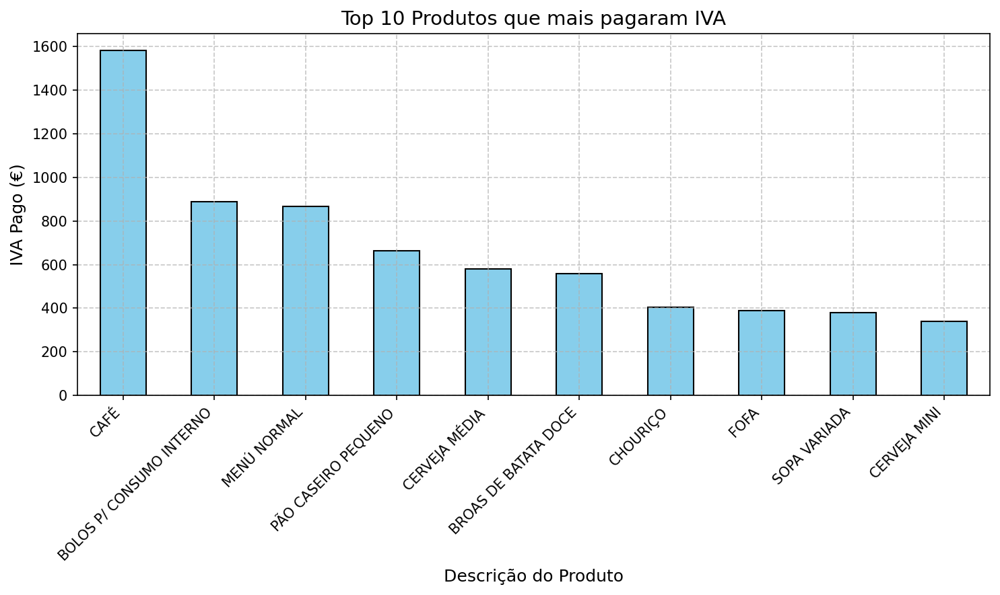

In [165]:
paga_mais_iva = df_vendas.groupby('ProductDescription41')['TaxPayable'].sum()
paga_mais_iva = paga_mais_iva.sort_values(ascending=False)
paga_mais_iva.head(10)

# Criar gráfico
plt.figure(figsize=(10, 6), dpi=150)
paga_mais_iva.head(10).plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top 10 Produtos que mais pagaram IVA', fontsize=14)
plt.xlabel('Descrição do Produto', fontsize=12)
plt.ylabel('IVA Pago (€)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(linestyle='--', alpha=0.7)
plt.tight_layout()

# Mostrar o gráfico
plt.show()

* Tabaco em falta - taxa de iva a 0 na tabela

### f) Análise de preços

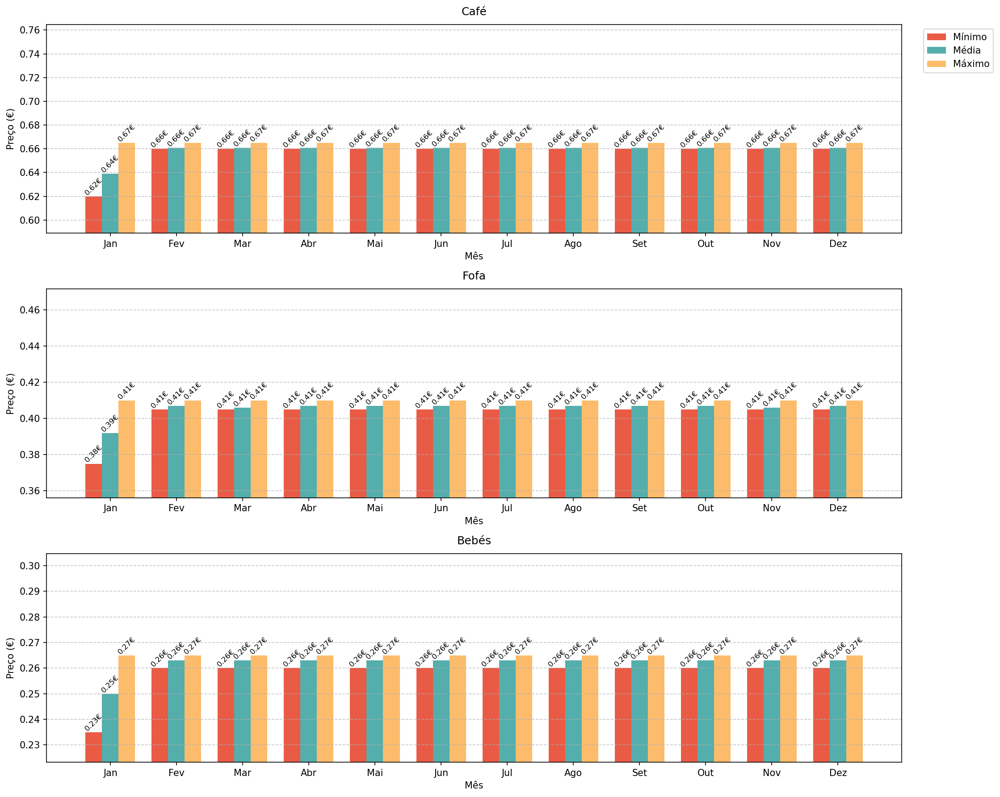


Café:
Preço mínimo geral: 0.620€
Preço máximo geral: 0.665€
Preço médio geral: 0.659€
Variação percentual: 7.3%

Fofa:
Preço mínimo geral: 0.375€
Preço máximo geral: 0.410€
Preço médio geral: 0.406€
Variação percentual: 9.3%

Bebés:
Preço mínimo geral: 0.235€
Preço máximo geral: 0.265€
Preço médio geral: 0.262€
Variação percentual: 12.8%


No início do ano, os preços do Café, Fofa e Bebés sofreram ajustes provavelmente relacionados com a subida da inflação, mas estabilizaram ao longo dos meses seguintes.


In [168]:
# Identificar as variações de valores do top 3 produtos mais vendidos ao longo de 2024
top3_products = df_vendas.groupby('Description42')['Quantity'].sum().sort_values(ascending=False).head(3)

monthly_prices = df_vendas[df_vendas['Description42'].isin(top3_products.index)].copy()
monthly_prices = monthly_prices[monthly_prices['UnitPrice'] > 0]
monthly_prices['month'] = monthly_prices['InvoiceDate'].dt.month

price_counts = monthly_prices.groupby(['month', 'Description42', 'UnitPrice']).size().reset_index(name='count')
valid_prices = price_counts[price_counts['count'] >= 5]
monthly_prices = monthly_prices.merge(valid_prices[['month', 'Description42', 'UnitPrice']], 
                                   on=['month', 'Description42', 'UnitPrice'])

monthly_stats = (monthly_prices.groupby(['month', 'Description42'])['UnitPrice']
                .agg(['min', 'max', 'mean'])
                .round(3)
                .reset_index())

fig, axs = plt.subplots(3, 1, figsize=(15, 12), dpi=150)

colors = ['#e95b45', '#fcbc6c', '#54aeac']
labels = ['Mínimo', 'Máximo', 'Média']

for idx, product in enumerate(top3_products.index):
    product_data = monthly_stats[monthly_stats['Description42'] == product]
    
    x = product_data['month']
    width = 0.25
    
    axs[idx].bar(x - width, product_data['min'], width, label='Mínimo', color=colors[0])
    axs[idx].bar(x, product_data['mean'], width, label='Média', color=colors[2])
    axs[idx].bar(x + width, product_data['max'], width, label='Máximo', color=colors[1])
    
    for i, (minimum, mean, maximum) in enumerate(zip(product_data['min'], 
                                                   product_data['mean'], 
                                                   product_data['max'])):
        month = i + 1
        axs[idx].text(month - width, minimum, f'{minimum:.2f}€', 
                     ha='center', va='bottom', fontsize=8, rotation=45)
        axs[idx].text(month, mean, f'{mean:.2f}€', 
                     ha='center', va='bottom', fontsize=8, rotation=45)
        axs[idx].text(month + width, maximum, f'{maximum:.2f}€', 
                     ha='center', va='bottom', fontsize=8, rotation=45)
    
    axs[idx].set_title(f'{product}', pad=10)
    axs[idx].set_xlabel('Mês')
    axs[idx].set_ylabel('Preço (€)')
    axs[idx].grid(True, linestyle='--', alpha=0.7, axis='y')
    axs[idx].set_xticks(range(1, 13))
    axs[idx].set_xticklabels(['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 
                             'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'])
    
    ymin = product_data['min'].min() * 0.95
    ymax = product_data['max'].max() * 1.15
    axs[idx].set_ylim(ymin, ymax)
    
    if idx == 0:
        axs[idx].legend(bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

for product in top3_products.index:
    product_data = monthly_stats[monthly_stats['Description42'] == product]
    min_price = product_data['min'].min()
    max_price = product_data['max'].max()
    mean_price = product_data['mean'].mean()
    
    if min_price > 0:
        pct_variation = round(((max_price - min_price) / min_price * 100), 1)
        
        print(f"\n{product}:")
        print(f"Preço mínimo geral: {min_price:.3f}€")
        print(f"Preço máximo geral: {max_price:.3f}€")
        print(f"Preço médio geral: {mean_price:.3f}€")
        print(f"Variação percentual: {pct_variation}%")


print("\n\nNo início do ano, os preços do Café, Fofa e Bebés sofreram ajustes provavelmente relacionados com a subida da inflação, mas estabilizaram ao longo dos meses seguintes.")

* Os preços apenas sofreram atualizações em Janeiro.


## 5. Previsões

### 5.1. Prophet

In [172]:
# Preparar dados diários para o Prophet
df_daily_sales = df_vendas.groupby('date')['NetTotal'].sum().reset_index()

# Renomear colunas para o formato do Prophet
df_prophet = df_daily_sales.rename(columns={'date': 'ds', 'NetTotal': 'y'})

# Criar e treinar o modelo
m = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
    seasonality_mode='multiplicative'
)
m.fit(df_prophet)

21:20:25 - cmdstanpy - INFO - Chain [1] start processing
21:20:25 - cmdstanpy - INFO - Chain [1] done processing


In [173]:
# Dataframe para previsão até final de dezembro
future = m.make_future_dataframe(periods=23)  # 23 dias até 31 de dezembro

In [174]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2024-01-02,215.864158,143.720613,289.967302
1,2024-01-03,221.108609,148.734742,299.728402
2,2024-01-04,253.194149,181.418700,325.877559
3,2024-01-05,257.611549,184.626838,328.082015
4,2024-01-06,307.477264,232.500608,378.723615
...,...,...,...,...
360,2024-12-27,315.410352,241.036408,388.464872
361,2024-12-28,393.855918,313.544798,465.918524
362,2024-12-29,432.202002,357.819295,503.085312
363,2024-12-30,329.531680,253.740583,399.542680


C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



<Figure size 2250x1200 with 0 Axes>

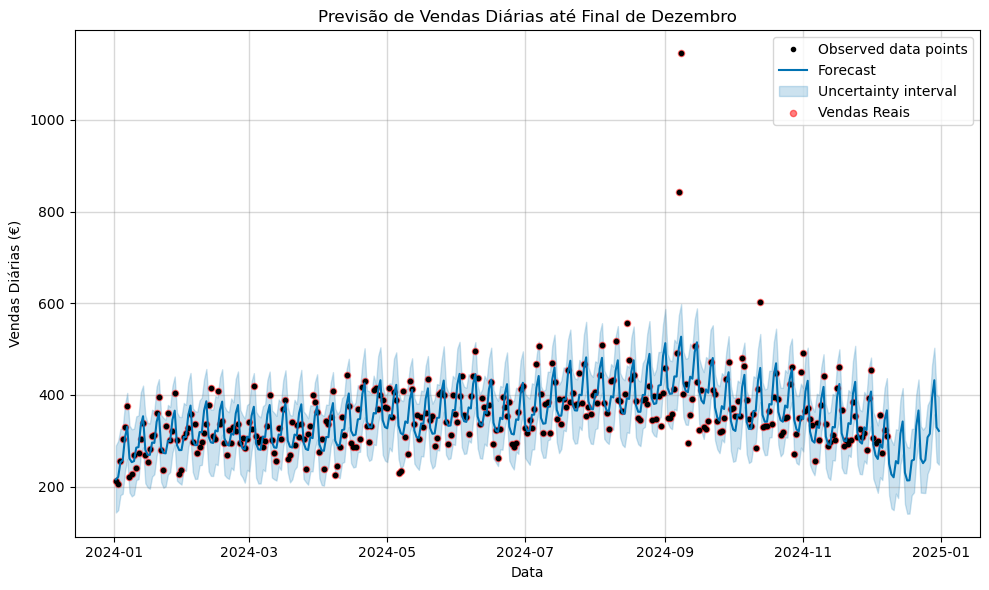

In [175]:
# Resultados com pontos de vendas reais
plt.figure(figsize=(15, 8), dpi=150)
m.plot(forecast, xlabel='Data', ylabel='Vendas Diárias (€)')
plt.title('Previsão de Vendas Diárias até Final de Dezembro')
plt.grid(True, alpha=0.3)

plt.scatter(df_prophet['ds'], df_prophet['y'], 
           color='red', alpha=0.5, s=20, 
           label='Vendas Reais')
plt.legend()
plt.tight_layout()
plt.show()

C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:351: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:354: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

C:\Users\sergio\anaconda3\Lib\site-packages\prophet\plot.py:397: FutureWarni

<Figure size 2250x1800 with 0 Axes>

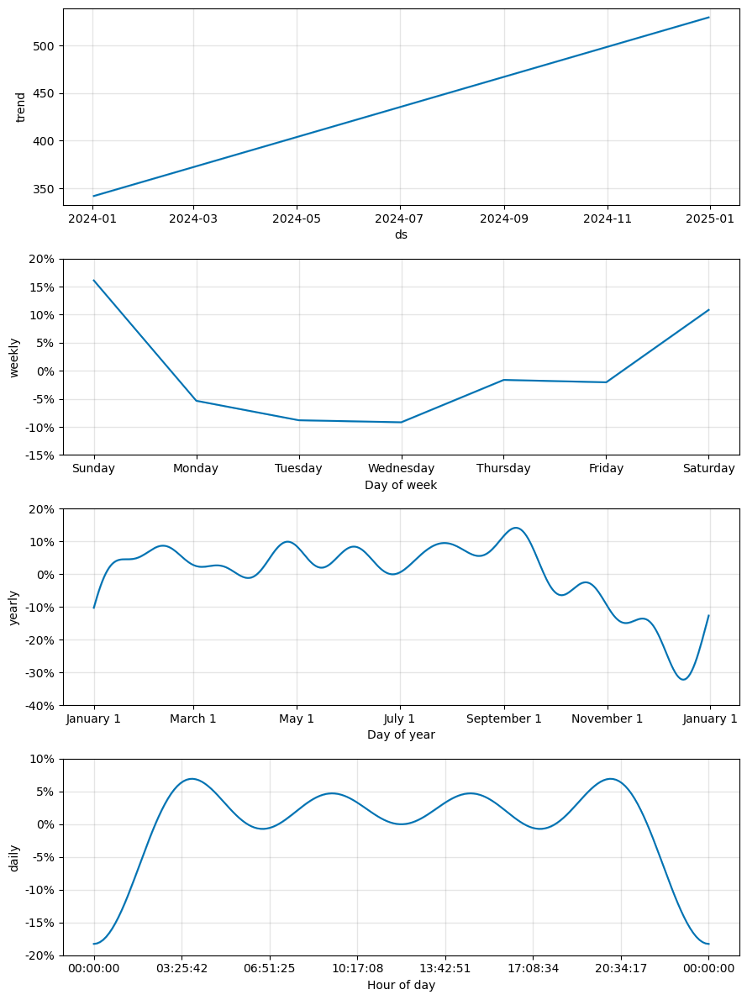

In [176]:
# Componentes da previsão
plt.figure(figsize=(15, 12), dpi=150)
m.plot_components(forecast)
plt.tight_layout()
plt.show()

In [177]:
# Análise específica do período de Natal (23 a 25 de dezembro)
natal = forecast[forecast['ds'].dt.date >= pd.to_datetime('2024-12-23').date()]
natal = natal[natal['ds'].dt.date <= pd.to_datetime('2024-12-25').date()]

print("Previsão para o período de Natal:")
print("Data\t\tPrevisão\tIntervalo de Confiança")
for _, row in natal.iterrows():
    print(f"{row['ds'].date()}\t{row['yhat']:.2f}€\t({row['yhat_lower']:.2f}€ - {row['yhat_upper']:.2f}€)")

print("\nTotal previsto para o Natal:", natal['yhat'].sum().round(2), "€")

Previsão para o período de Natal:
Data		Previsão	Intervalo de Confiança
2024-12-23	261.23€	(187.00€ - 332.10€)
2024-12-24	251.26€	(186.49€ - 324.35€)
2024-12-25	258.31€	(186.16€ - 330.85€)

Total previsto para o Natal: 770.81 €


In [178]:
forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ds                          365 non-null    datetime64[ns]
 1   trend                       365 non-null    float64       
 2   yhat_lower                  365 non-null    float64       
 3   yhat_upper                  365 non-null    float64       
 4   trend_lower                 365 non-null    float64       
 5   trend_upper                 365 non-null    float64       
 6   daily                       365 non-null    float64       
 7   daily_lower                 365 non-null    float64       
 8   daily_upper                 365 non-null    float64       
 9   multiplicative_terms        365 non-null    float64       
 10  multiplicative_terms_lower  365 non-null    float64       
 11  multiplicative_terms_upper  365 non-null    float64       

In [179]:
# Calcular métricas de avaliação para o período histórico
forecast = m.predict(future)
y_true = df_prophet['y']
y_pred = forecast['yhat'][:len(df_prophet)]

r2 = r2_score(y_true, y_pred)
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)

print("Métricas de Avaliação do Modelo:")
print(f"R² Score: {r2:.4f}")
print(f"RMSE: {rmse:.2f}€")
print(f"MAE: {mae:.2f}€")
print(f"Erro Percentual Médio: {(mae/y_true.mean())*100:.2f}%")

Métricas de Avaliação do Modelo:
R² Score: 0.4993
RMSE: 56.58€
MAE: 35.22€
Erro Percentual Médio: 9.86%


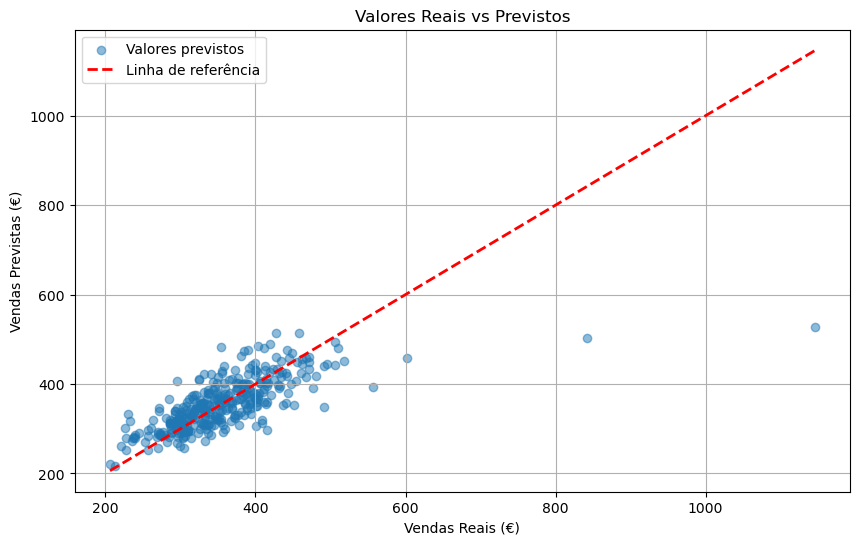

In [180]:
# Valores reais vs previstos
plt.figure(figsize=(10, 6))
plt.scatter(y_true, y_pred, alpha=0.5, label='Valores previstos')
plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2, label='Linha de referência')
plt.xlabel('Vendas Reais (€)')
plt.ylabel('Vendas Previstas (€)')
plt.title('Valores Reais vs Previstos')
plt.legend()
plt.grid(True)
plt.show()

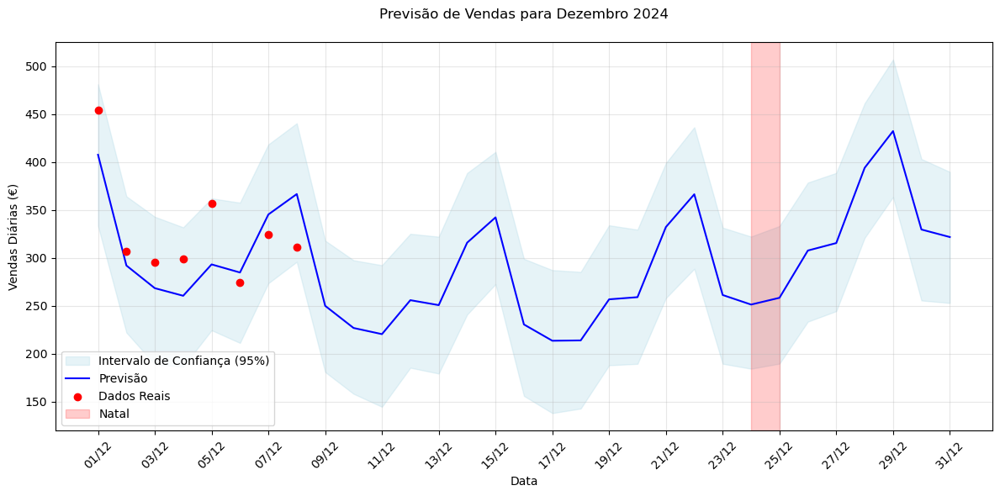

In [181]:
# Filtrar apenas dezembro
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'])
dezembro = forecast[forecast['ds'].dt.month == 12].copy()
dados_reais = df_prophet[df_prophet['ds'].dt.month == 12].copy()

plt.figure(figsize=(12, 6))

# Intervalo de confiança
plt.fill_between(dezembro['ds'], 
                 dezembro['yhat_lower'],
                 dezembro['yhat_upper'],
                 alpha=0.3, color='lightblue',
                 label='Intervalo de Confiança (95%)')

# Linha de previsão
plt.plot(dezembro['ds'], dezembro['yhat'], 
         color='blue', linestyle='-', 
         label='Previsão')

# Dados reais
plt.scatter(dados_reais['ds'], dados_reais['y'],
           color='red', label='Dados Reais',
           zorder=5)

# Destacar período do Natal
natal_inicio = pd.to_datetime('2024-12-24')
natal_fim = pd.to_datetime('2024-12-25')
plt.axvspan(natal_inicio, natal_fim, 
            alpha=0.2, color='red',
            label='Natal')

plt.title('Previsão de Vendas para Dezembro 2024', pad=20)
plt.xlabel('Data')
plt.ylabel('Vendas Diárias (€)')
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
ax = plt.gca()
ax.xaxis.set_major_locator(DayLocator(interval=2))
ax.xaxis.set_major_formatter(DateFormatter('%d/%m'))
plt.legend()
plt.tight_layout()
plt.show()

* Como seria expectável, o modelo não consegue prever a anomalia associada ao período do Natal sem dados históricos referentes a esse período
* Também em Dezembro, o modelo estima um vale com subida até Janeiro dado que a série estava incompleta e não temos mais dados de Dezembro (sazonalidade anual não capturada completamente e pouco representada - muito ruidosa)
* O fit pode ser analisado através do $R^2$ $\approx$ 0.5 - o que indica um ajuste longe do ideal (1)
* Valores previstos:
    * 23/12: 261.23€
    * 24/12: 251.26€  

### 5.2. Com base em literatura

Estima-se que a faturação de Dezembro represente 9% da faturação anual (JN):

X = 0.09X + 119623.59 $\Leftrightarrow$ 0.91X = 119623.59 $\Leftrightarrow$ X = $\frac{119623.59}{0.91}$ = 131454.49 $\Rightarrow$ Faturação em Dezembro = 0.09 x 131454.49 $\approx$ 11,830.9€ 

In [185]:
print('Mediana Diária no dataset:', df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').median().mean())

Mediana Diária no dataset: 349.09945454545453


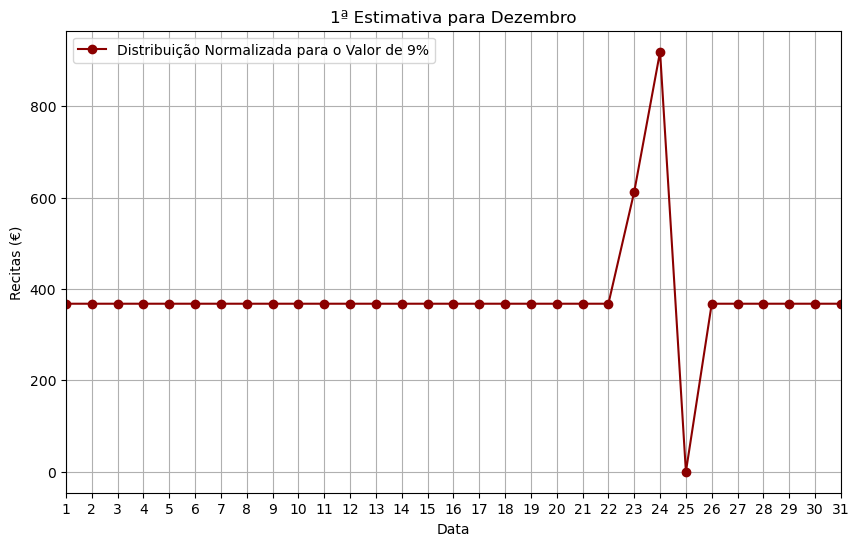

1ª estimativa para 23: 613.00
1ª estimativa para 24: 919.50
372.1182843296902


In [186]:
# Update the total value
mes_dezembro = 11830.9
valor_diario_estimado = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').median().median()

valores = np.ones(31) * valor_diario_estimado # cria um array com todos os valores iguais à mediana
valores[24] = 0  # 25 Dezembro = 0 
valores[23] = 2.5 * valor_diario_estimado # 24 com n x um dia "normal"
valores[22] = 2 * valores[23] / 3 # subida abrupta para 23 que seria 2/3 do valor de 24 - não sei se é realista mas dado o comportamento das receitas nas festividades o resultado não parece estranho)
# normalização
valores = valores * (mes_dezembro / valores.sum())

datas = pd.date_range(start='2024-12-01', end='2024-12-31').to_series()

valores_smoothed = gaussian_filter(valores, sigma=0.5)
valores_smoothed[24] = 0 
valores_smoothed *= (mes_dezembro / valores_smoothed.sum())  

plt.figure(figsize=(10, 6))
plt.plot(datas, valores, label='Distribuição Normalizada para o Valor de 9%', linestyle='-', marker='o', color='darkred')

plt.title('1ª Estimativa para Dezembro')
plt.xlabel("Data")
plt.xticks(datas, datas.dt.day)
plt.xlim(datas.min(),datas.max())
plt.ylabel('Recitas (€)')
plt.legend()
plt.grid()
plt.show()

print(f"1ª estimativa para 23: {valores[22]:.2f}")
print(f"1ª estimativa para 24: {valores[23]:.2f}")
print(np.median(valores_smoothed))

Parece-nos, olhando para Setembro (com 3 dias de festividades) que a estimativa de 11,830.9€ é, no entanto, muito baixa (seria apenas o 4º melhor mês do ano 2024). Olhando para dados globais de faturação vs Setembro temos:

In [202]:
print(f"Valor Médio por Fatura em Setembro: {df_vendas[df_vendas['month'] == 9].groupby('InvoiceNo')['NetTotal'].mean().mean():.3f}€")
print(f"Valor Médio por Fatura: {df_vendas.groupby('InvoiceNo')['NetTotal'].mean().mean():.3f}€")
print("")
print(f"Preço Unitário Médio por Fatura em Setembro: {df_vendas[df_vendas['month'] == 9].groupby('InvoiceNo')['UnitPrice'].mean().mean():.3f}€")
print(f"Preço Unitário por Fatura: {df_vendas.groupby('InvoiceNo')['UnitPrice'].mean().mean():.3f}€")
print("")
print(f"Quantidades Médias por Fatura em Setembro: {df_vendas[df_vendas['month'] == 9].groupby('InvoiceNo')['Quantity'].mean().mean():.3f}")
print(f"Quantidades Médias por Fatura: {df_vendas.groupby('InvoiceNo')['Quantity'].mean().mean():.3f}")
print("")
print(f"Faturas em Setembro: {df_vendas[df_vendas['month'] == 9].groupby('InvoiceNo').ngroups}")
print(f"Número médio de Faturas por mês: {df_vendas.groupby('month')['InvoiceNo'].nunique().mean():.3f}")

Valor Médio por Fatura em Setembro: 1.542€
Valor Médio por Fatura: 1.446€

Preço Unitário Médio por Fatura em Setembro: 1.183€
Preço Unitário por Fatura: 1.100€

Quantidades Médias por Fatura em Setembro: 1.551
Quantidades Médias por Fatura: 1.563

Faturas em Setembro: 4691
Número médio de Faturas por mês: 3710.500


Em Setembro valor médio por fatura aumentou apesar das quantidades reduzirem ligeiramente por fatura - a clientela sazonal compra artigos mais caros (preços unitários médios mais altos).

Também o número de faturas aumentou em $\approx$ 1400 - poderia ser também por aumento de disponibilidade (dias de festa abertos o dia inteiro) - mas verificamos que até tem um valor inferior a Agosto. Portanto podemos assumir para o Natal, em que as pessoas estão mais em casa e em família, e dia 25 fecha, um número de faturas inferior de 8200 (valor médio diário é ~250 faturas).

Dado que no Natal as pastelarias e padarias vendem mais bolos para consumo externo, que têm preço unitário maior (por ex. Bolo Rei$\approx$ 10€/kg), podemos assumir que o custo médio por fatura é pelo menos igual a Setembro $\approx 1.55$.

Assim:

$Estimativa = 8200 \times 1.55 = 12710$€

E deste modo o mês de Dezembro representaria pelo menos o segundo melhor mês do ano em receita.

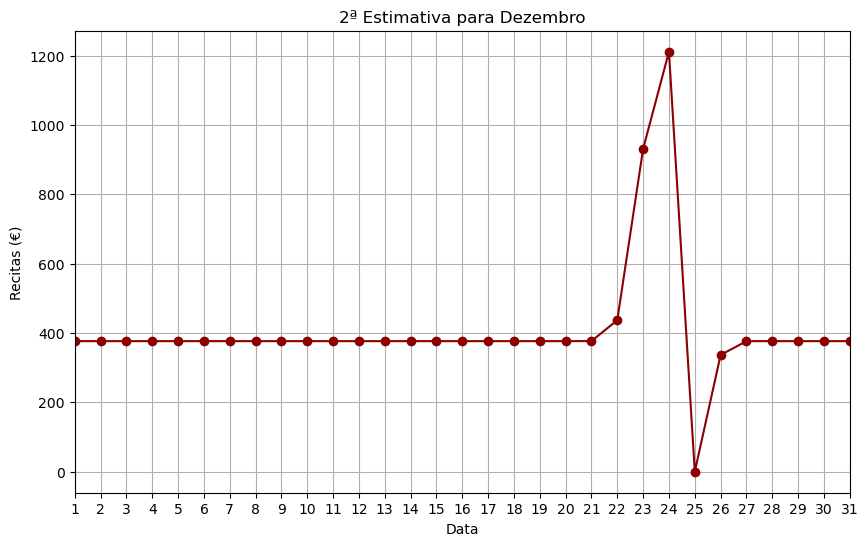

2ª estimativa para 23: 931.24
2ª estimativa para 24: 1211.47
376.6658576695113


In [204]:
# Update the total value
mes_dezembro = 12710.
#valor_diario_estimado = df_vendas[df_vendas['month'] < 12].groupby(['month', 'date'])['NetTotal'].sum().groupby('month').median().median()
valor_diario_estimado = 310
valores = np.ones(31) * valor_diario_estimado # cria um array com todos os valores iguais à média
valores[24] = 0  # 25 Dezembro = 0 
valores[23] = 3.75 * valor_diario_estimado # pico de 24 estimado como como n x dia "normal"
valores[22] = (2/3) * valores[23]# subida abrupta para 23 
# normalização
valores = valores * (mes_dezembro / valores.sum())

datas = pd.date_range(start='2024-12-01', end='2024-12-31').to_series()

valores_smoothed = gaussian_filter(valores, sigma=0.5)
valores_smoothed[24] = 0 
valores_smoothed *= (mes_dezembro / valores_smoothed.sum())  

plt.figure(figsize=(10, 6))
plt.plot(datas, valores_smoothed, linestyle='-', marker='o', color='darkred')

plt.title('2ª Estimativa para Dezembro')
plt.xlabel("Data")
plt.xticks(datas, datas.dt.day)
plt.xlim(datas.min(),datas.max())
plt.ylabel('Recitas (€)')
plt.grid()
plt.show()

print(f"2ª estimativa para 23: {valores_smoothed[22]:.2f}")
print(f"2ª estimativa para 24: {valores_smoothed[23]:.2f}")
print(np.median(valores_smoothed)) # parametro para optimizar o multiplicativo do pico de modo a que a mediana nos restantes dias não suba ou desça demasiado 
# mediana em setembro foi 397 mas até ao dia 8 a mediana de Dezembro era ~309
# dono refere faturação entre 1300 e 2500

# Nota: sem dados históricos é muito dificil optimizar o comportamento por volta destes dias...e estimar o pico

Este é um resultado credível dado que o nosso standard para a estimativa foi o Setembro e estimámos conservadoramente uma facturação abaixo do mesmo...

## 6. Insights e Conclusões

### 6.1. Insights

* **Quais são os dias e horas de maior movimento?**
  + Parte da manhã - mais faturas, receitas, quantidades vendidas - às 11h e 12h - com um segundo pico às 7h
  + Fim-de-semana - pico ao domingo 

                
* **Existe um padrão semanal ou mensal claro?**
  + Não existe padrão mensal claro (dia do mês)
  + Vendas aumentam ao longo da semana, com valores mais altos ao domingo
  + Pico semanal é domingos às 11h

* **Que Categorias são mais vendidas?**
  + Padaria + Pastelaria + Cafetaria vendem em maior quantidade
  + Padaria + Tabaco + Pastelaria geram maior receita

* **Que Produtos são mais vendidos?**
  + Café + fofas + bebés vendidos em maior quantidade
  + Café + pão caseiro pequeno + lucky strike geram maior receita


* **Que Produtos são mais vendidos em conjunto?**
  + De modo geral: pão, café e tabaco

* **Quanto se espera vender no Natal?**

  *Prophet*
  * Dada a amostragem reduzida não consegue prever anomalia do período de natal
  * Valores previstos:
    * 23/12: 261.23€
    * 24/12: 251.26€

   
  *Estimativas Ad-hoc* 
  + Estima-se que a faturação de Dezembro represente 9% da faturação anual (JN)
  + Durante os meses de Janeiro a Novembro a padaria facturou 119,623.59€
  + Para 2024 representaria: 11,830.9€
  + O que com base numa "distribuição normalizada" de valores (ver assumpções acima) significaria:
      * 23/12: 613.0 € 
      * 24/12: 919.5 €

  + Assumindo valores de faturação de Setembro, estimamos pelo menos uma receita de: 12710.0 €
  + O que com base numa "distribuição normalizada" de valores (ver assumpções acima) significaria:
      * 23/12: 931.24 € 
      * 24/12: 1211.47 €    
    
**Nota:** É necessário mais parametros para optimização do fitting - dados sobre o período em questão

* **Quanto de IVA se paga ao mês?**
  + em média o IVA foi 1161.10€ por mês


* **Quais os produtos onde se paga mais IVA?**
  + Café
  + No entanto seria expectável que fosse o tabaco, dado que se venderam $\approx$3000 unidades, no período em estudo, o que é $\approx$ 14000€ de receita e que significa $\approx$ 3220 € de IVA >> IVA café - mas o tabaco tem um modo taxação de IVA diferente, à entrada (agradecimento à Nádia pelo esclarecimento)

### 6.2. Conclusões

* **Sugestões de ação**
  + Fazer "happy hour" ao fim da tarde - estilo Too Good to Go de forma a escoar produto e evitar desperdício 
  + Tentar motivar início da semana com promoções do dia - menu temático por dia da semana - ou um bebé bonus na compra de outros
  + Opções Saudáveis:
      + Adicionar opções como pães integrais, bolos sem açúcares refinados, produtos sem glúten ou sem lactose, para atrair um público mais amplo.
  + Limpar a "base dados" de maneira a facilitar a análise futura
      +  Exemplo: "Produto A" pode aparecer como "Produto A", "produto a", ou "PRODUTO A". Isto cria redundâncias que tornam a análise menos eficiente.
      +  Exemplo: Em vez de permitir texto livre para o nome do produto, usar um sistema de seleção (ex.: dropdown menu) para garantir uniformidade.
  + Os horários com maior movimento (ex.: entre as 9h e 12h, especialmente ao domingo) sugerem a necessidade de mais funcionários disponíveis para lidar com o aumento do fluxo de clientes.
      + Folgas devem ser planeadas em dias com menor movimento.
      + Funcionários que trabalham nos horários de maior movimento poderiam receber compensações, como dias de folga extra ou horários menos intensos noutros dias.
      + Adoção de turnos mais curtos e sobrepostos durante os períodos críticos (ex.: das 9h às 12h) pode ajudar a lidar com o aumento de afluência sem comprometer a produtividade dos funcionários garantindo uma experiência positiva para o cliente e aumentando as vendas.
  + Usar apps de delivery para expandir o alcance.
  + Perguntar diretamente aos clientes ou usar formulários online para recolher sugestões de melhoria.